In [154]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import scipy
import wave

# Graphing helper function
def setup_graph(title='', x_label='', y_label='', fig_size=None):
    fig = plt.figure()
    if fig_size != None:
        fig.set_size_inches(fig_size[0], fig_size[1])
    ax = fig.add_subplot(111)
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

# Introduction to Digital Signal Processing

For the purpose of my notebook as an introduction to DSP, I will be examining sound signals.

## Systems and Signals

Excitations are input signals and responses are output signals.
Some examples of signal forms include continuous, discrete, analog, digital, periodic, non-periodic, even symmetry, odd symmetry, and no symmetry forms.
Signals with special waveforms include ramps, exponentials, and impulses.

Signals and systems are either continuous or discrete.

Practical applications of systems include imagers, signal denoising, image deblurring, heart monitoring, music transcribing, and temperature control.


## CONTINUOUS VS. DISCRETE SIGNALS

Mathematically, a signal is any variation of quantity as a function of an independent variable.

Continuous means it is a function which varies with spatial location and time.
Discrete means you are sampling/indexing data from the function at a certain time.

Sampling Theory: There are a minimum number of points to sample a curve, known as 2 * Nyquist frequency.


## CAUSAL VS. NONCAUSAL

Physically realizable systems are real systems (as opposed to purely conceptual or mathematical constructs).

If x(t) == 0 for t < 0, then x(t) is causal.
If x(t) != 0 for t < 0, then x(t) is noncausal.
If x(t) == 0 for t > 0, then x(t) is anticausal.

In practice, we want to evaluate the interaction of causal signals with real systems.


## UNDAMPED VS DAMPED SYSTEMS

Undamped systems have no opposing force to slow down the motion.
Damped systems fade with time (negative e)

The Mass Spring Problem (Simple Harmonic Motion) includes parameters of mass, the spring (which ahs a constant k relating to the material properties of the spring), and force (kx(t) in terms of the spring's properties).


## FAST FOURIER TRANSFORM

Fourier Transform: a mathematical loop to transfer data from the time (spatial, amplitude vs time) to frequency (wave, amplitude vs frequency) domain.

Essentially, we are unmixing the overall signal into its separate signals, and usually we will find a number of higher-amplitude signals that can represent the overall signal and ignore the smaller-amplitude ones as just noise. 
Then, we run the FFT to convert the signals to the frequency domain.

The Phasor diagram is just a nice way to look at our signal mathematically, however we should not rely on it.

# Here, we see visualizations of sound waves for a whistle, pulse, and dial ring.

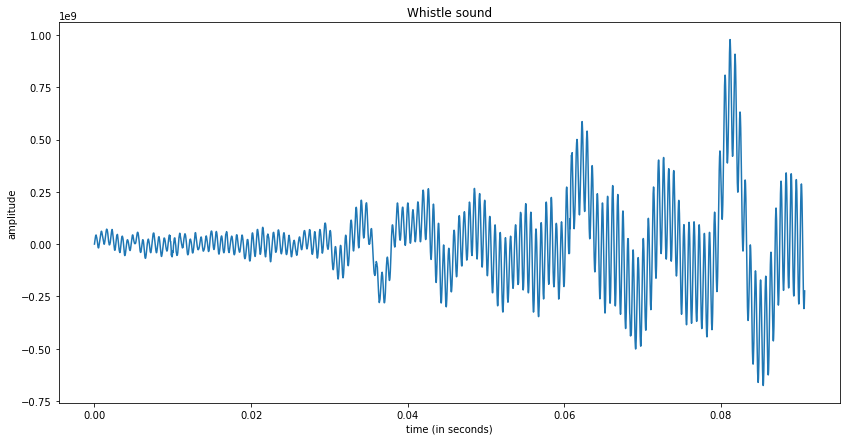

In [155]:
import scipy.io.wavfile

(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Whistle.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Whistle sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

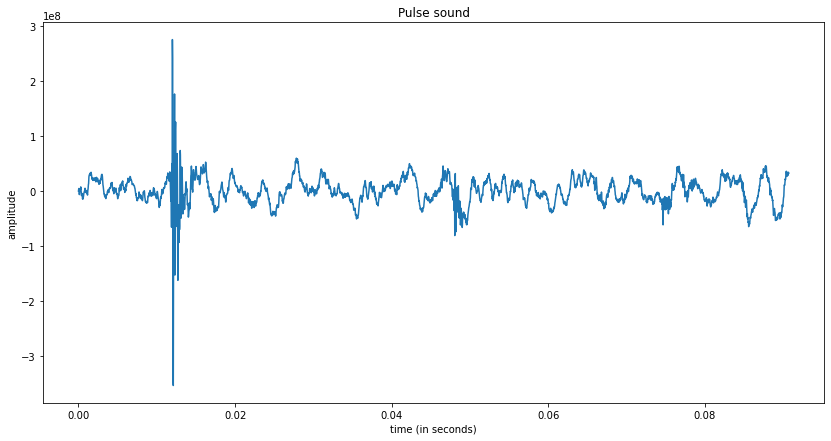

In [156]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Pulse.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Pulse sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

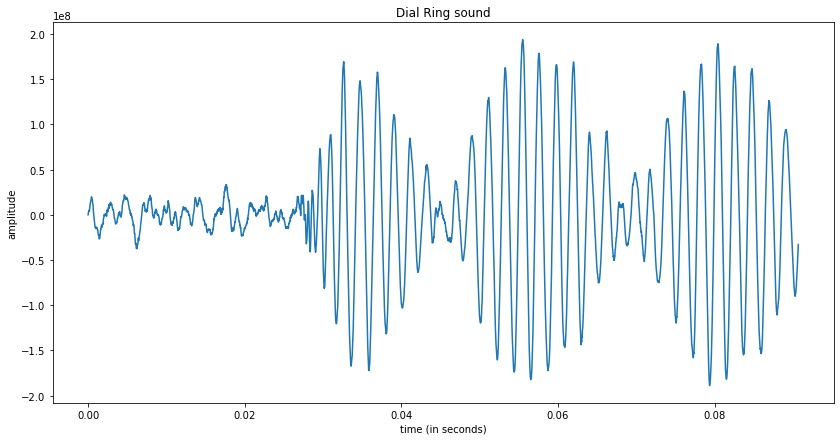

In [157]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Dial Ring.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial Ring sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

# The Superposition Principle

* We find that any signal is the result from summing other individual signals.

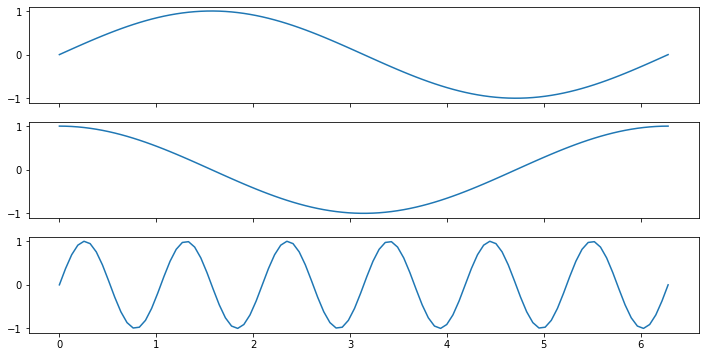

In [158]:
x = np.linspace(0, 2 * np.pi, 100)
y1 = np.sin(x)
y2 = np.cos(x)
y3 = np.sin(6*x)

f, axarr = plt.subplots(3, sharex=True, sharey=True)
f.set_size_inches(12,6)
axarr[0].plot(x, y1)
axarr[1].plot(x, y2)
axarr[2].plot(x, y3)
_ = plt.show()

## We sum these 3 signals into one signal as shown below.

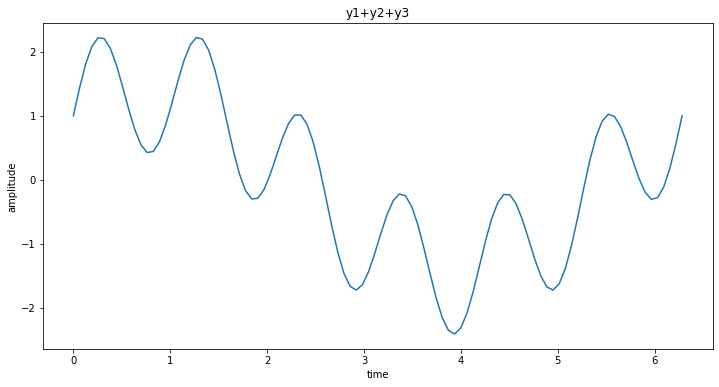

In [159]:
setup_graph(x_label='time', y_label='amplitude', title='y1+y2+y3', fig_size=(12,6))
convoluted_wave = y1 + y2 + y3
_ = plt.plot(x, convoluted_wave)

# Fast Fourier Transform
Let's look at the sum of another 3 signals:

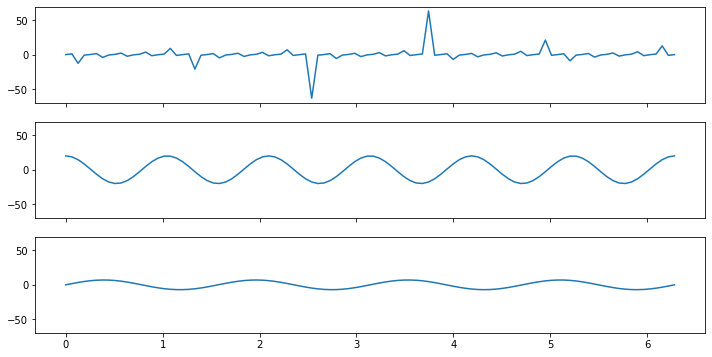

In [160]:
x = np.linspace(0, 2 * np.pi, 100)
y1 = np.tan(13*x)
y2 = 20 * np.cos(6*x)
y3 = 7 * np.sin(4*x)

f, axarr = plt.subplots(3, sharex=True, sharey=True)
f.set_size_inches(12,6)
axarr[0].plot(x, y1)
axarr[1].plot(x, y2)
axarr[2].plot(x, y3)
_ = plt.show()

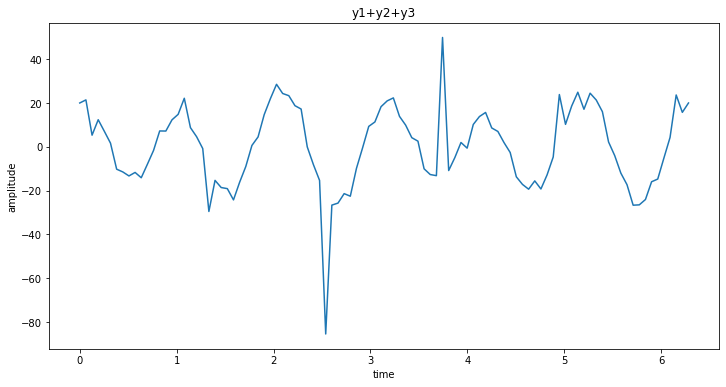

In [161]:
setup_graph(x_label='time', y_label='amplitude', title='y1+y2+y3', fig_size=(12,6))
convoluted_wave = y1 + y2 + y3
_ = plt.plot(x, convoluted_wave)

We use FFT on this signal to convert it from the time domain to frequency domain.

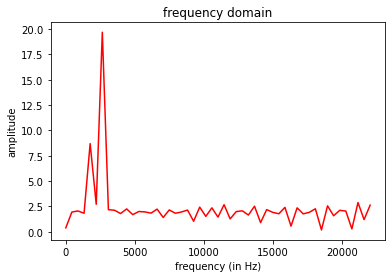

In [162]:
fft_output = np.fft.rfft(convoluted_wave)
num_samples = len(convoluted_wave)
magnitude_only = [np.sqrt(i.real**2 + i.imag**2)/len(fft_output) for i in fft_output]
frequencies = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]
setup_graph(x_label='frequency (in Hz)', y_label='amplitude', title='frequency domain')
plt.plot(frequencies, magnitude_only, 'r')

Now let's apply FFT to our audio signals from earlier. (44100 kHz)

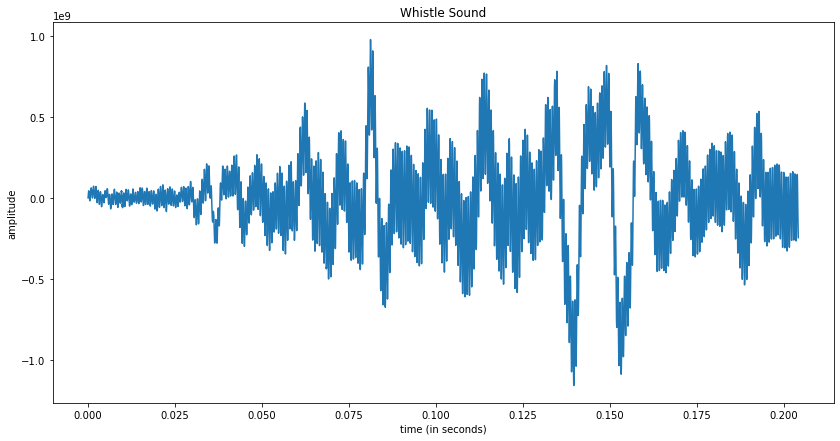

In [163]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Whistle.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Whistle Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:9000], input_signal[0:9000])

(0.0, 300.0)

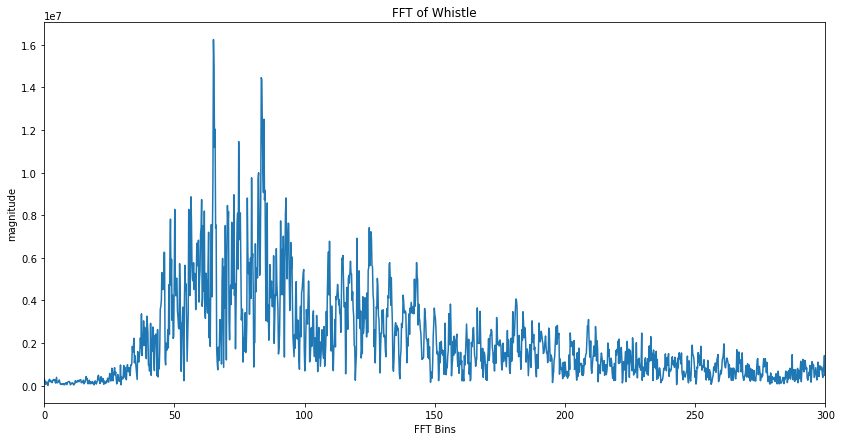

In [164]:
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Whistle', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:3000], fft_mag[0:3000])
plt.xlim(0, 300)

44100


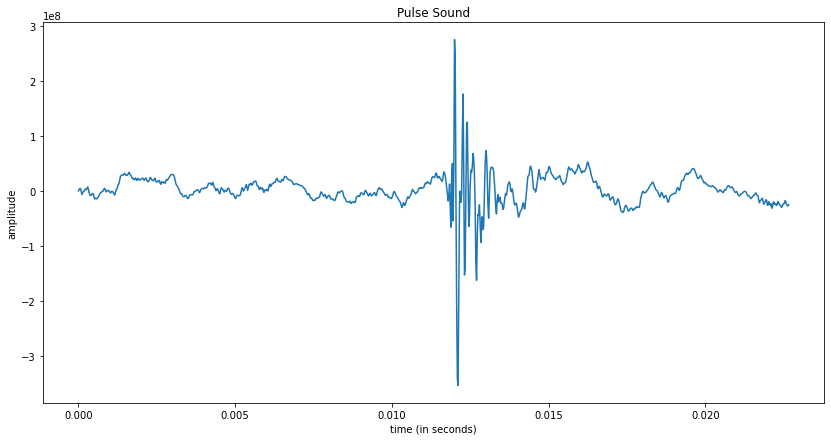

In [165]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Pulse.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Pulse Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:1000], input_signal[0:1000])
print(sample_rate)

(0.0, 500.0)

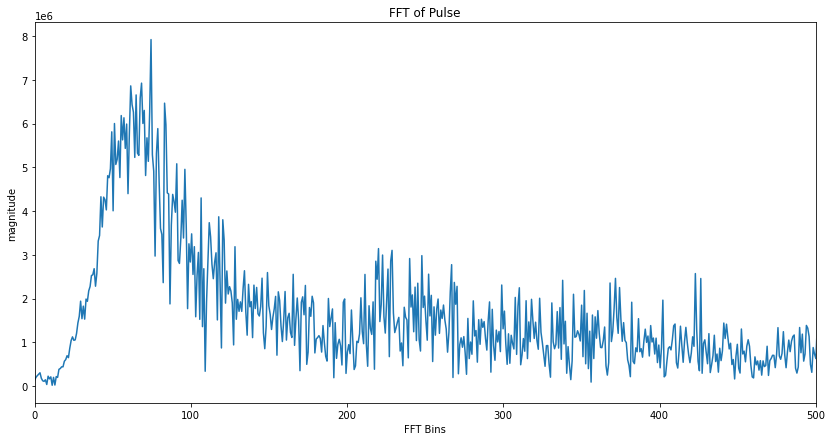

In [166]:
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Pulse', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:1000], fft_mag[0:1000])
np.max(rfreqs)
len(rfreqs)
plt.xlim(0,500)

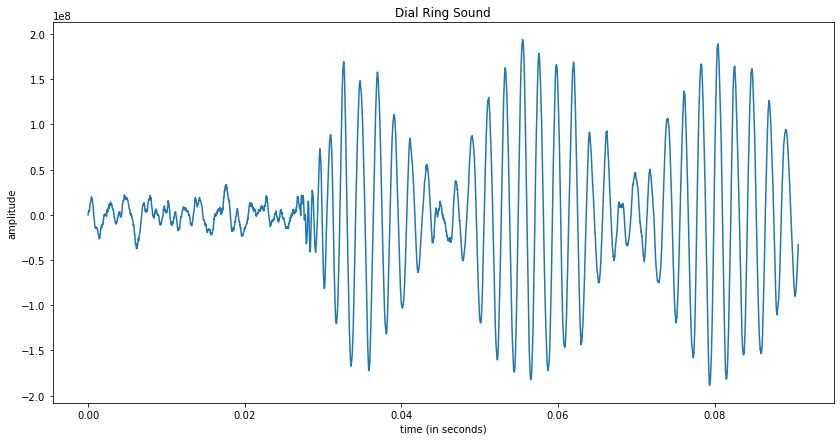

In [167]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DSP - Dial Ring.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial Ring Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

(400.0, 500.0)

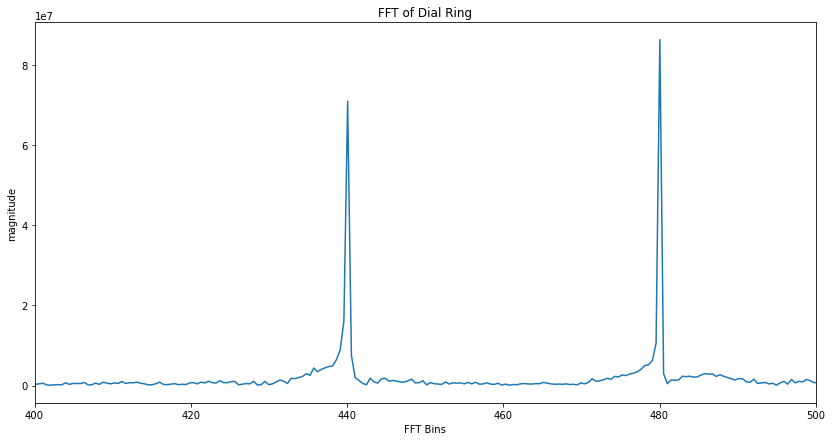

In [168]:
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial Ring', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:3000], fft_mag[0:3000])
plt.xlim(400, 500)

# Spectrograms (FFT Over Time - 3D)
We determine a suitable window size and slide it across the signal while applying FFT simultaenously (the windows can overlap).<br>
X-axis represents time<br>
Y-axis represents frequency<br>
Colors represent amplitude

In [169]:
(whistle_sample_rate, whistle) = scipy.io.wavfile.read("audio_files/DSP - Whistle.wav")

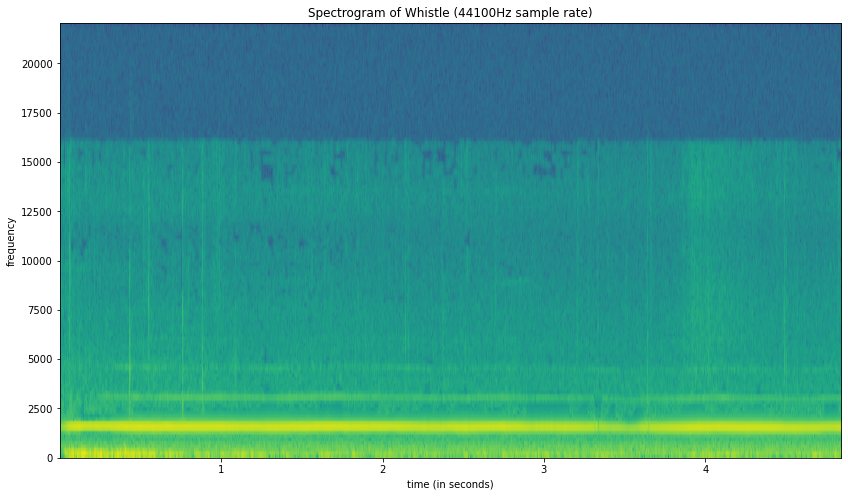

In [170]:
setup_graph(title='Spectrogram of Whistle (44100Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(whistle, Fs=whistle_sample_rate)

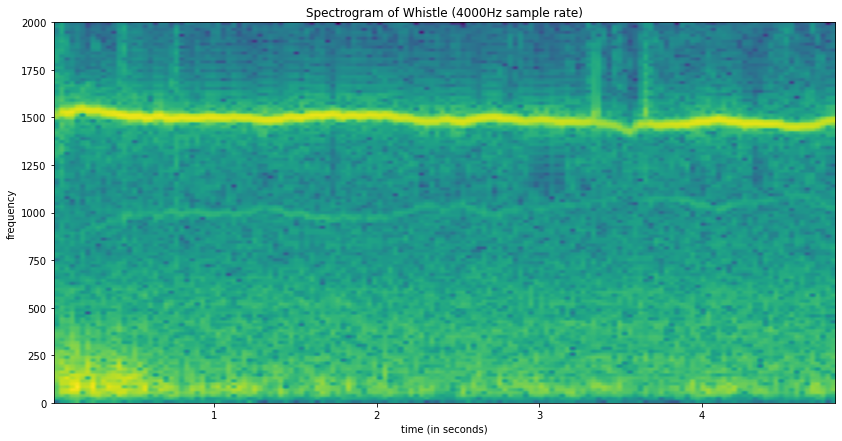

In [171]:
whistle_4000hz = [whistle[i] for i in range(0, len(whistle), 44100//4000)]
setup_graph(title='Spectrogram of Whistle (4000Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,7))
_ = plt.specgram(whistle_4000hz, Fs=4000)

In [172]:
(pulse_sample_rate, pulse) = scipy.io.wavfile.read("audio_files/DSP - Pulse.wav")

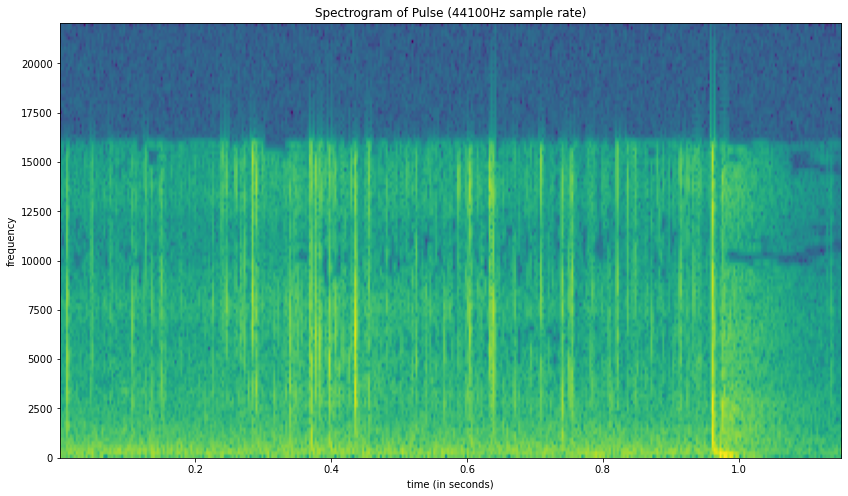

In [173]:
setup_graph(title='Spectrogram of Pulse (44100Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(pulse, Fs=pulse_sample_rate)

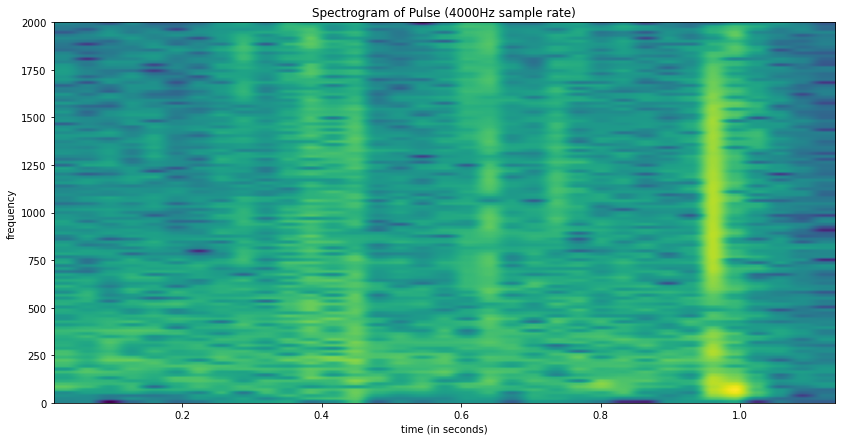

In [174]:
pulse_4000hz = [pulse[i] for i in range(0, len(pulse), 44100//4000)]
setup_graph(title='Spectrogram of Pulse (4000Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,7))
_ = plt.specgram(pulse_4000hz, Fs=4000)

In [175]:
(dialring_sample_rate, dialring) = scipy.io.wavfile.read("audio_files/DSP - Dial Ring.wav")

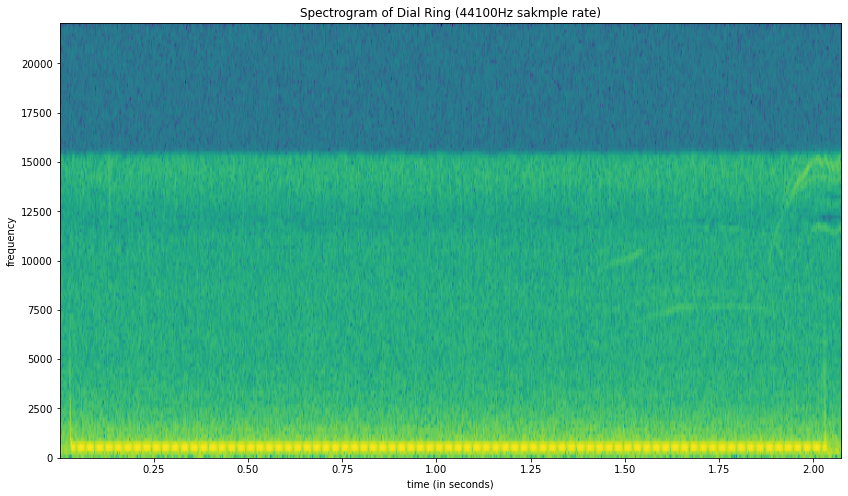

In [176]:
setup_graph(title='Spectrogram of Dial Ring (44100Hz sakmple rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(dialring, Fs=dialring_sample_rate)

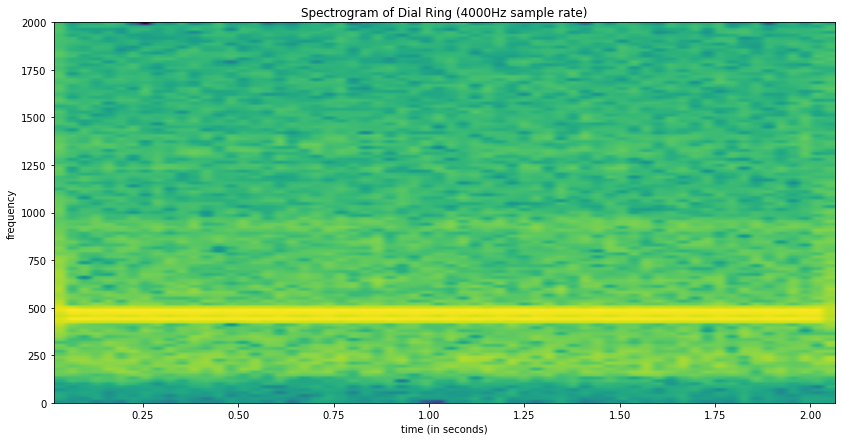

In [177]:
dialring_4000hz = [dialring[i] for i in range(0, len(dialring), 44100//4000)]
setup_graph(title='Spectrogram of Dial Ring (4000Hz sample rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,7))
_ = plt.specgram(dialring_4000hz, Fs=4000)

# Application of FFT: iPhone Dialpad Signals

## Dial 1 = F5 and D#6 (but a bit sharper)

(600.0, 1300.0)

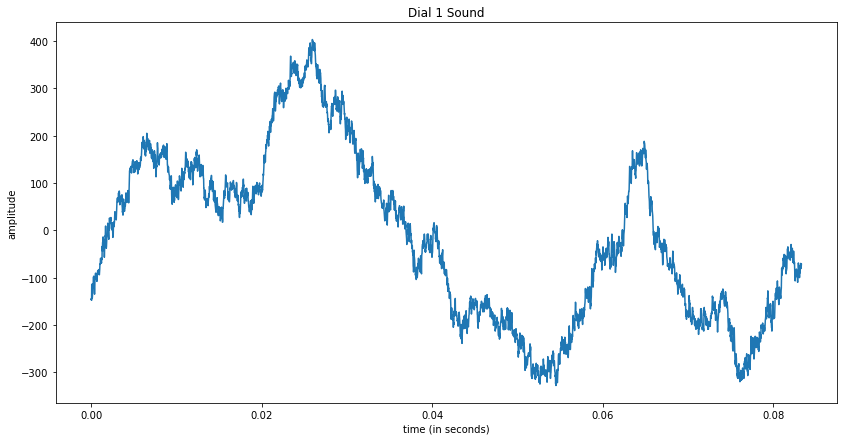

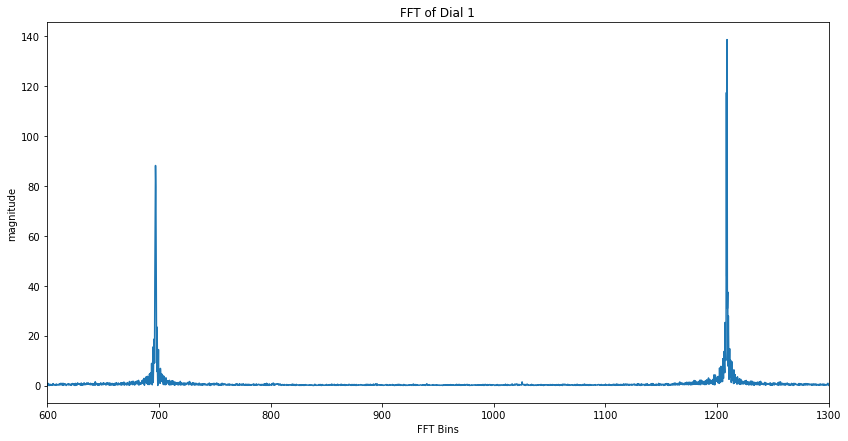

In [178]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial1.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 1 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 1', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:5000], fft_mag[0:5000])
plt.xlim(600, 1300)

## Dial 2 = F5 and F6 (but a bit flatter)

(600.0, 1500.0)

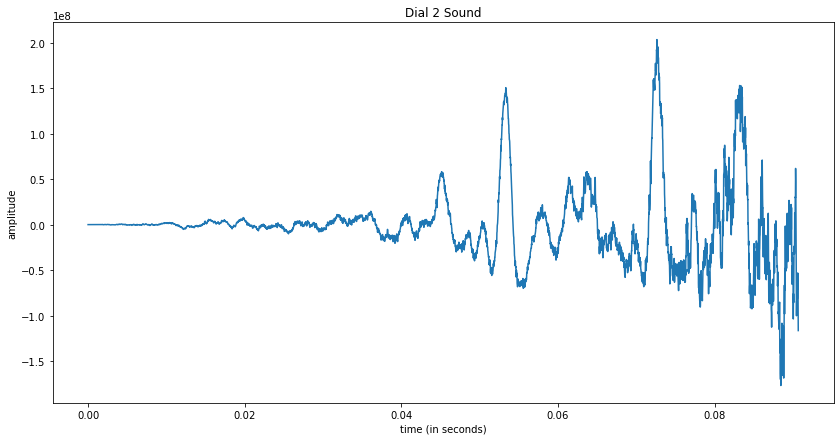

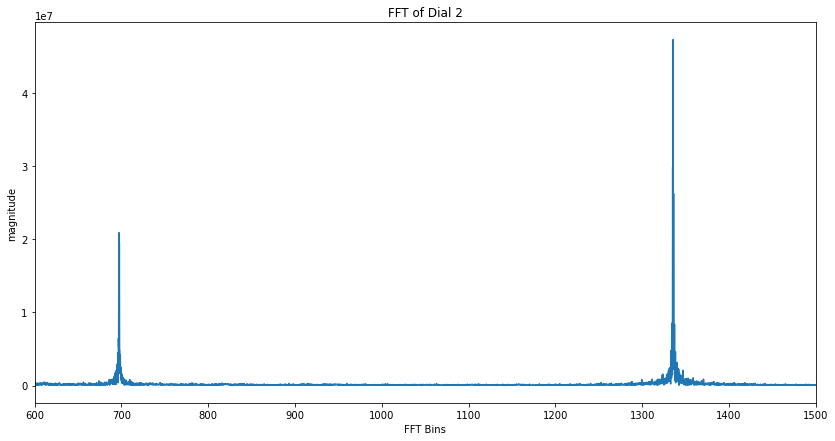

In [179]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial2.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 2 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 2', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:7000], fft_mag[0:7000])
plt.xlim(600, 1500)

## Dial 3 = F5 and F#6 (but a bit sharper)

(650.0, 1550.0)

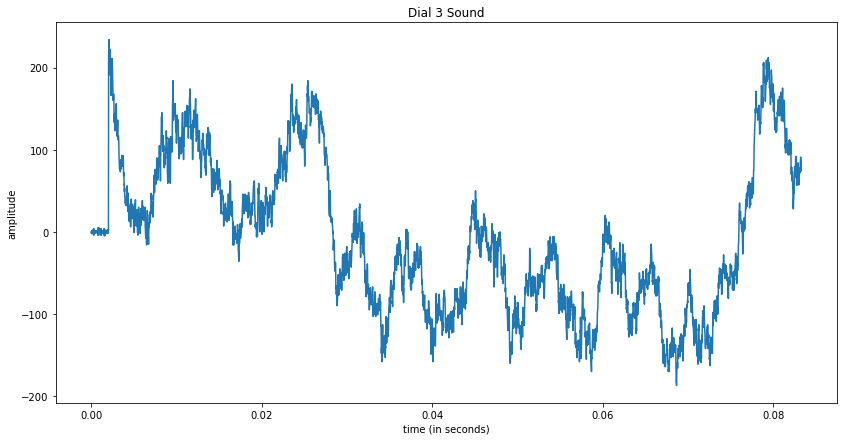

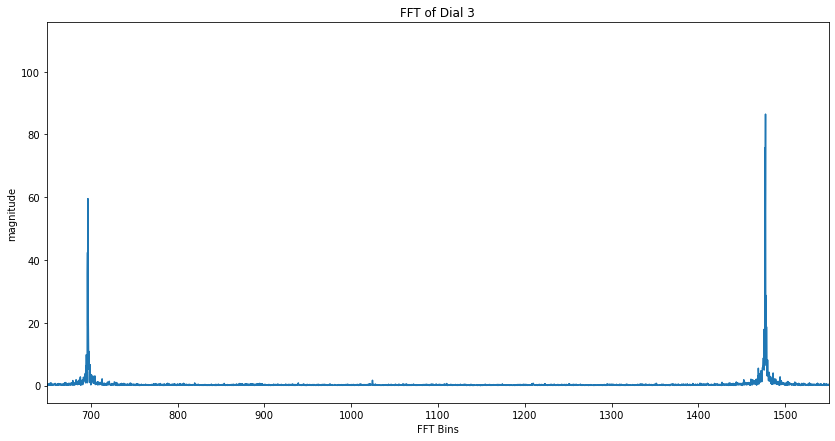

In [180]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial3.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 3 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 3', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:10000], fft_mag[0:10000])
plt.xlim(650, 1550)

## Dial 4 = G5 and D#6 (but a bit sharper)

(700.0, 1300.0)

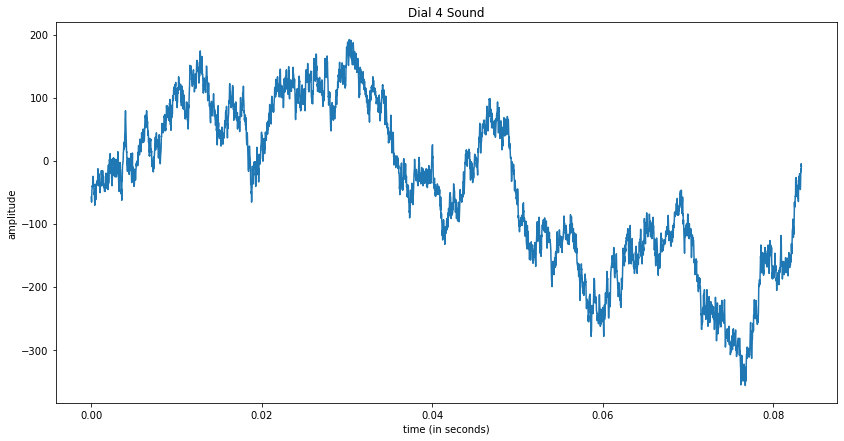

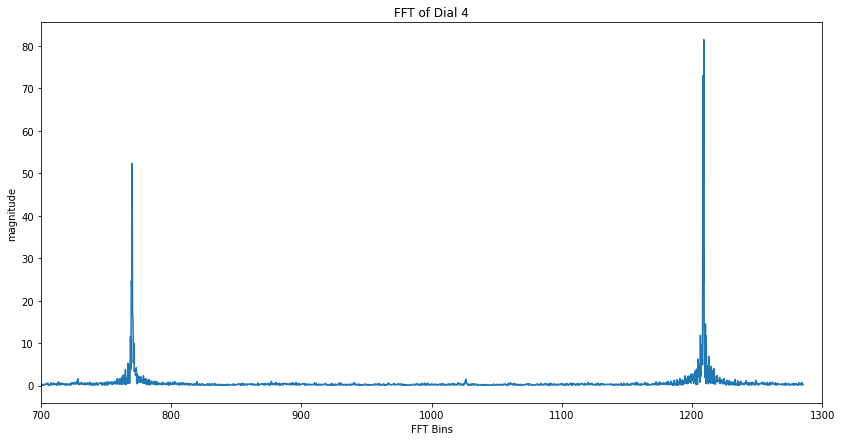

In [181]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial4.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 4 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 4', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:4000], fft_mag[0:4000])
plt.xlim(700, 1300)

## Dial 5 = G5 and F6 (but a bit flatter)

(700.0, 1400.0)

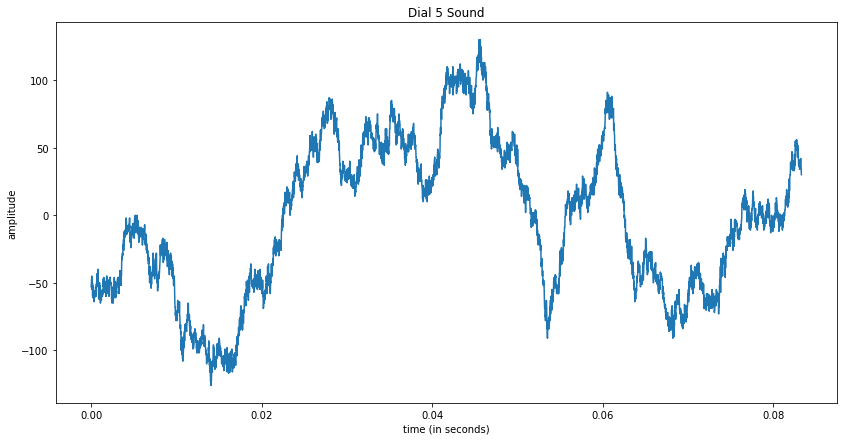

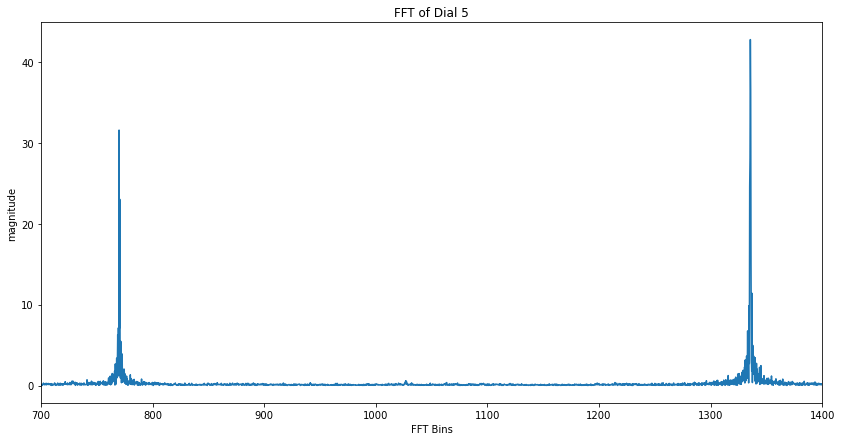

In [182]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial5.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 5 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 5', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:5000], fft_mag[0:5000])
plt.xlim(700, 1400)

## Dial 6 = G5 and F#6 (but a bit sharper)

(700.0, 1600.0)

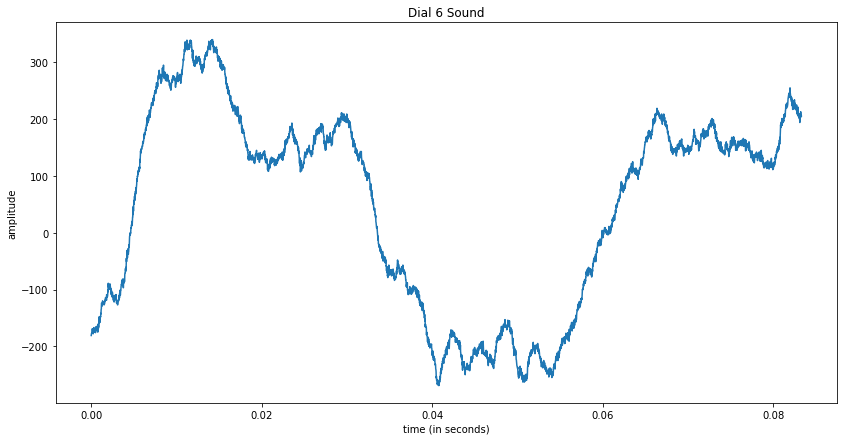

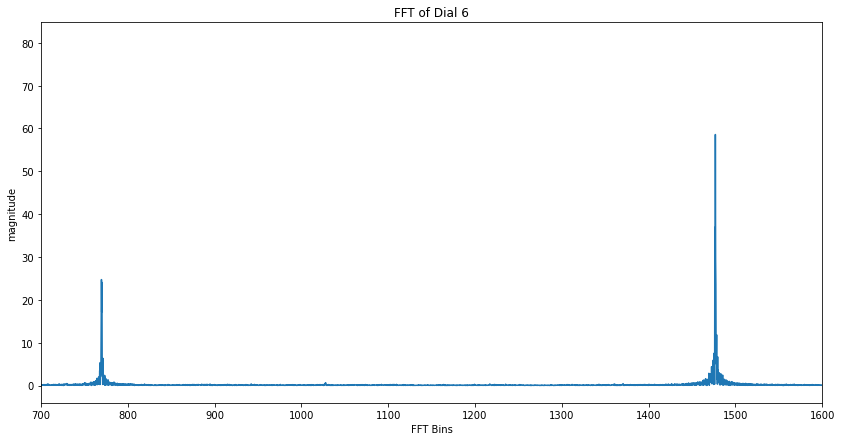

In [183]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial6.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 6 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 6', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(700, 1600)

## Dial 7 = G#5 and D#6 (but a bit sharper)

(800.0, 1300.0)

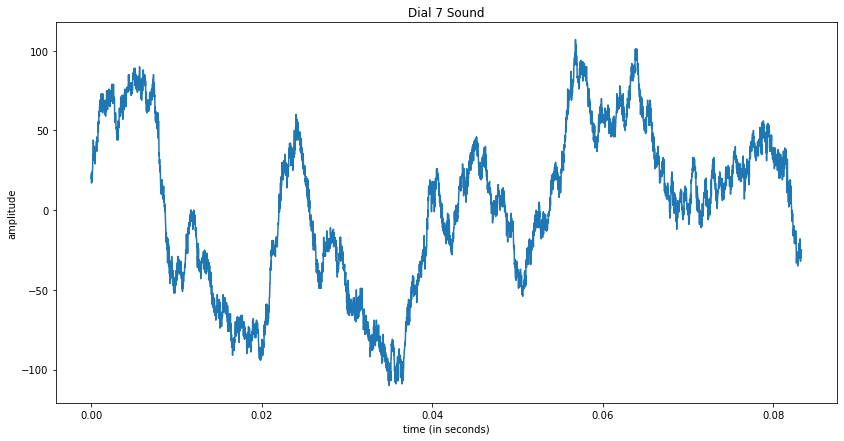

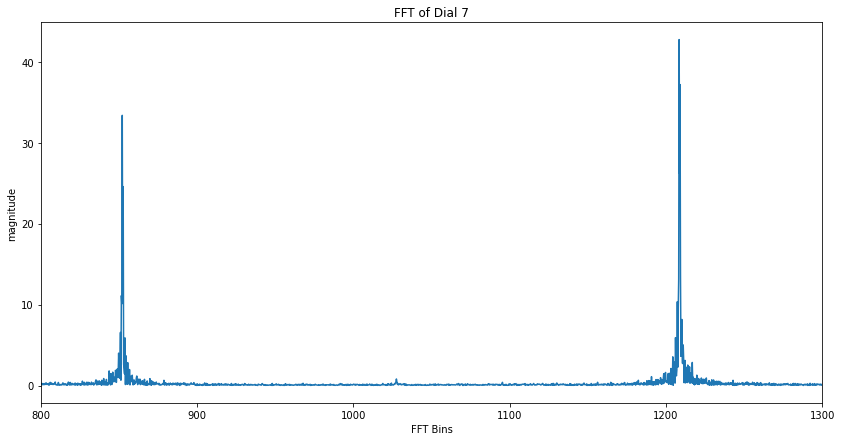

In [184]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial7.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 7 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 7', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(800, 1300)

## Dial 8 - G#5 and F6 (but a bit flatter)

(800.0, 1400.0)

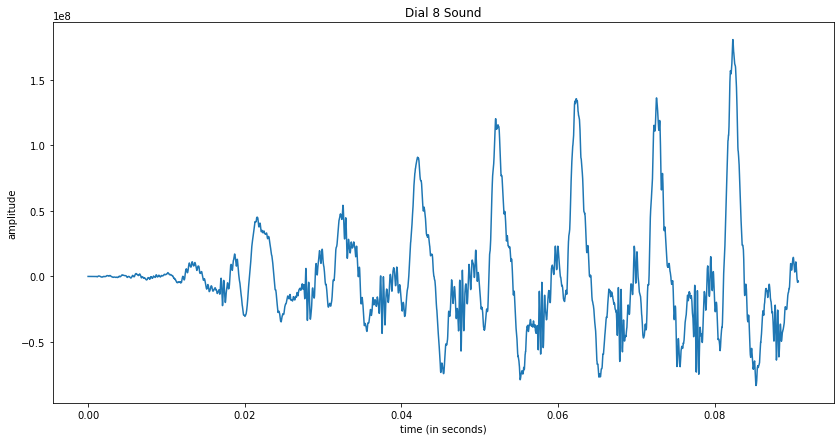

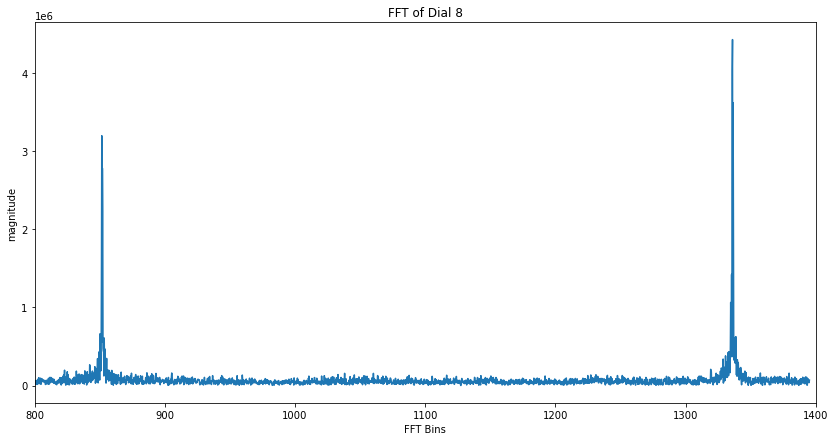

In [185]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial8.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 8 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 8', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(800, 1400)

## Dial 9 = G#5 and G6 (but a bit sharper)

(800.0, 1550.0)

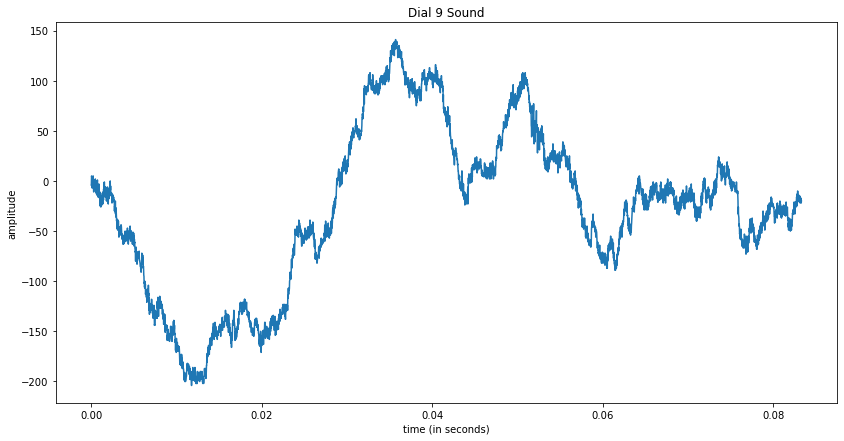

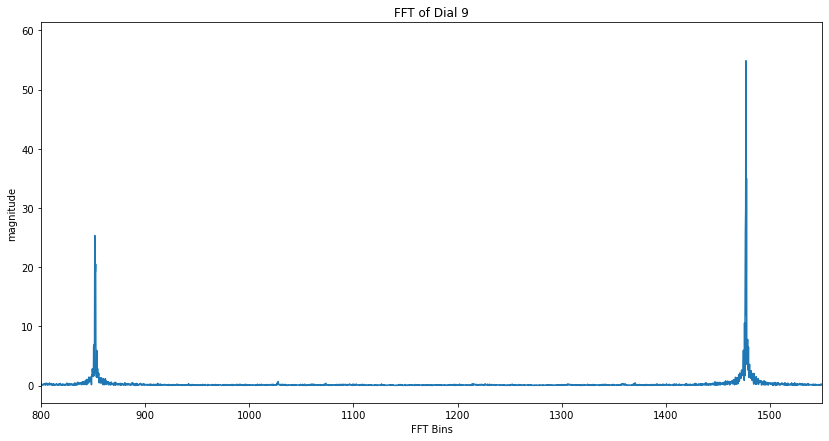

In [186]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial9.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 9 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 9', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(800, 1550)

## Dial * = A#5 and D#6 (but a bit sharper)

(900.0, 1250.0)

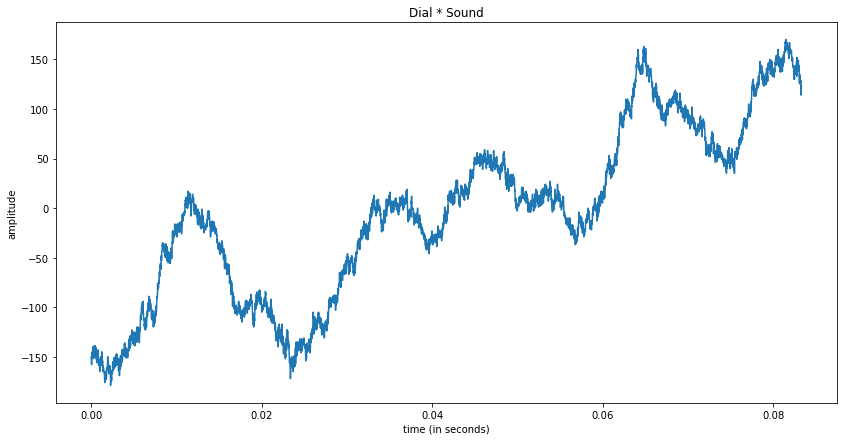

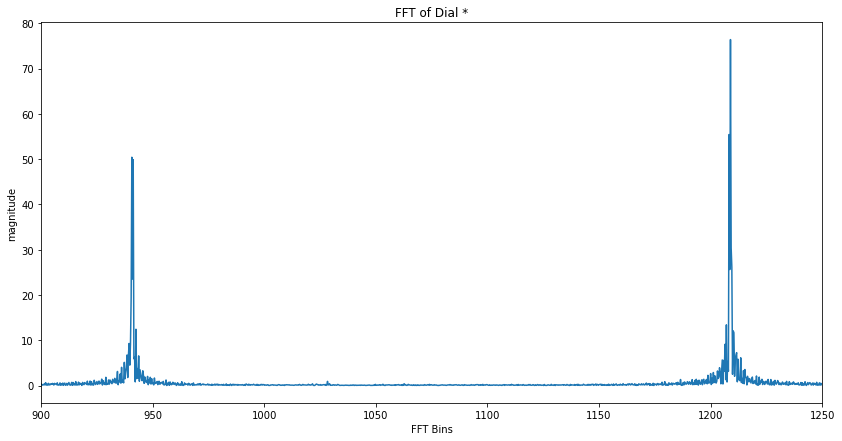

In [187]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DialStar.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial * Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial *', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:4500], fft_mag[0:4500])
plt.xlim(900, 1250)

## Dial 0 = A#5 and F6 (but a bit flatter)

(900.0, 1400.0)

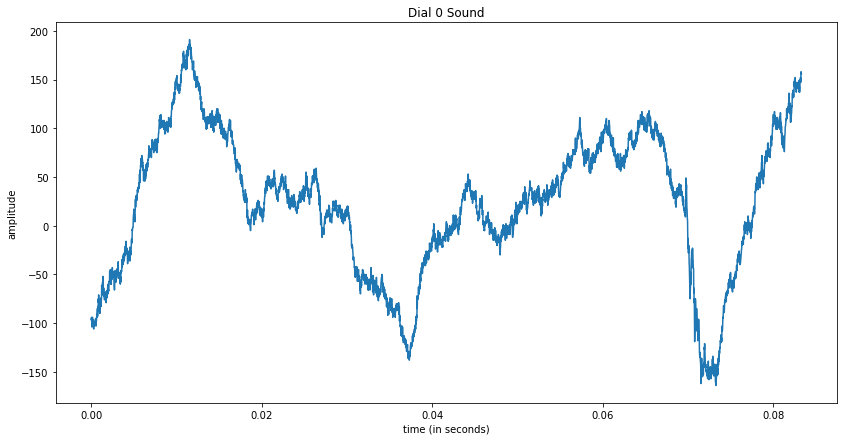

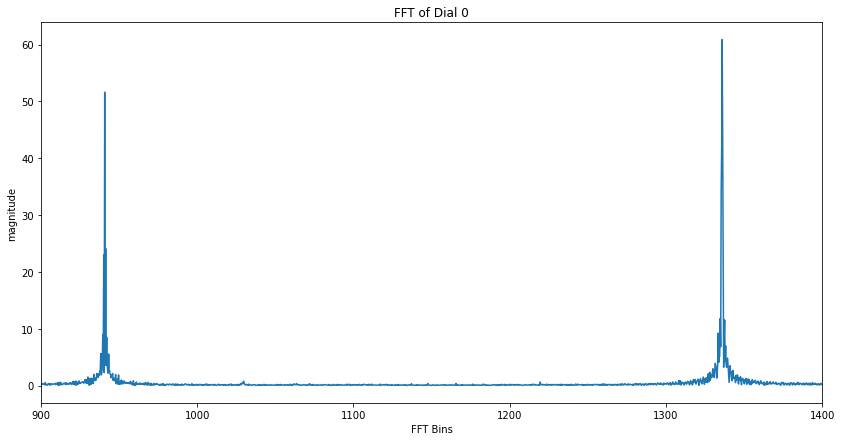

In [188]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Dial0.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial 0 Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial 0', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:4500], fft_mag[0:4500])
plt.xlim(900, 1400)

## Dial # = A#5 and F#6 (but a bit sharper)

(900.0, 1500.0)

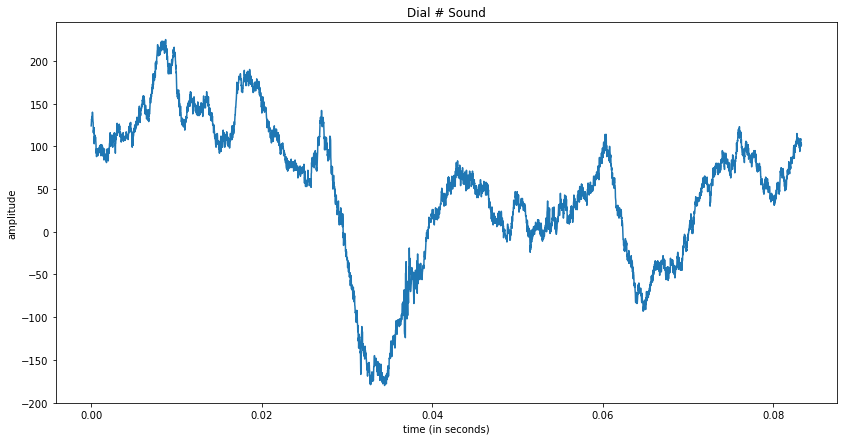

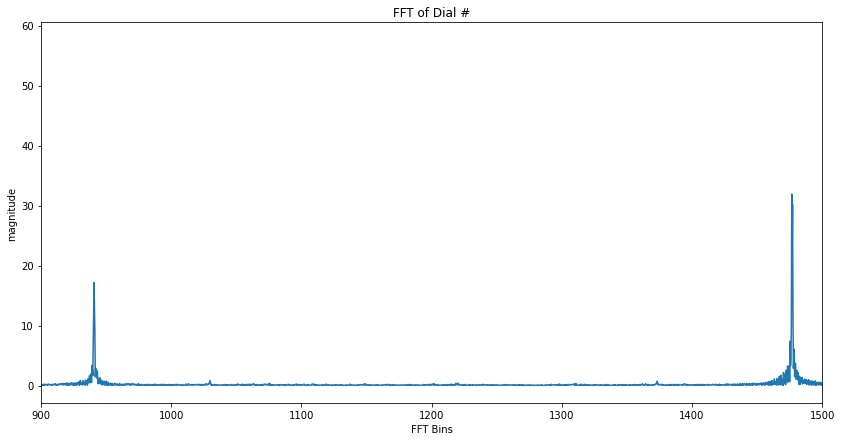

In [189]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/DialPound.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Dial # Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Dial #', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:6000], fft_mag[0:6000])
plt.xlim(900, 1500)

As we go down each column, the lower frequencies go F5, G5, G#5, A#5. As a tetrachord, they sound minor.<br>As we go across rows, the higher frequencies go D#6 (bit sharper), F6 (bit flatter), F#6 (bit sharper).As a trichord, they also sound minor.<br>We find that only the higher notes are detuned which causes the dialtones to sound dissonant. Converting our signals to the frequency domain through FFT also shows that these higher notes are between two notes' known frequencies.

# FFT and Inverse FFT Application: Finding Notes and their Sinusoidal Waves from an Audio Sample (Strummed Guitar Chord)

Sample Rate: 48000


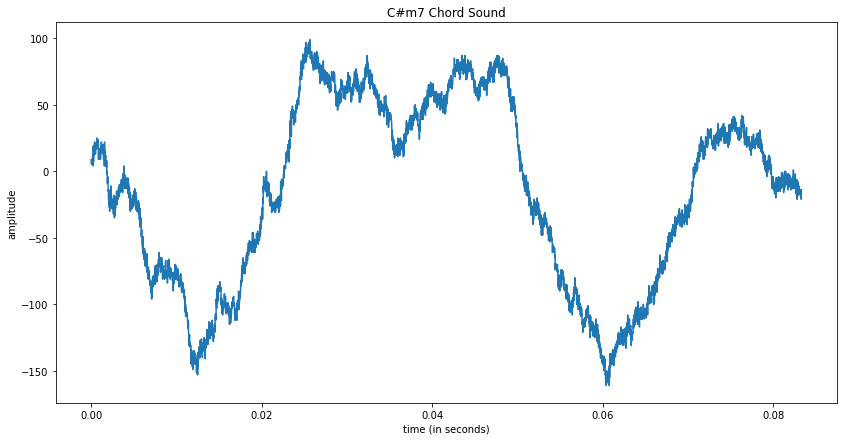

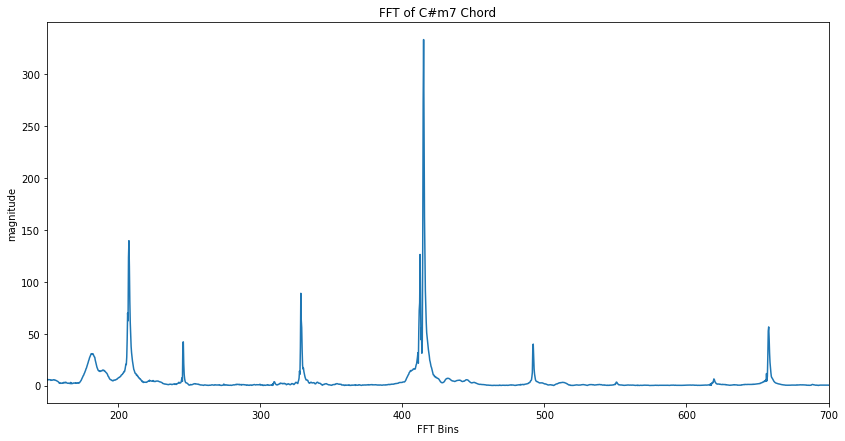

In [422]:
from scipy.signal import butter, lfilter
from scipy.fftpack import ifft


(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/C#m7 Chord.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='C#m7 Chord Sound', x_label='time (in seconds)', y_label='amplitude', fig_size=(14,7))
_ = plt.plot(time_array[0:4000], input_signal[0:4000])

# Apply Foward FFT to the signal
fft_data = np.fft.fft(input_signal)
fft_out = np.fft.rfft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of C#m7 Chord', x_label='FFT Bins', y_label='magnitude', fig_size=(14,7))
_ = plt.plot(rfreqs[0:5000], fft_mag[0:5000])
plt.xlim(150, 700)
print("Sample Rate:", sample_rate)

# Play the audio signal
from IPython.display import Audio
Audio(input_signal, rate=sample_rate)

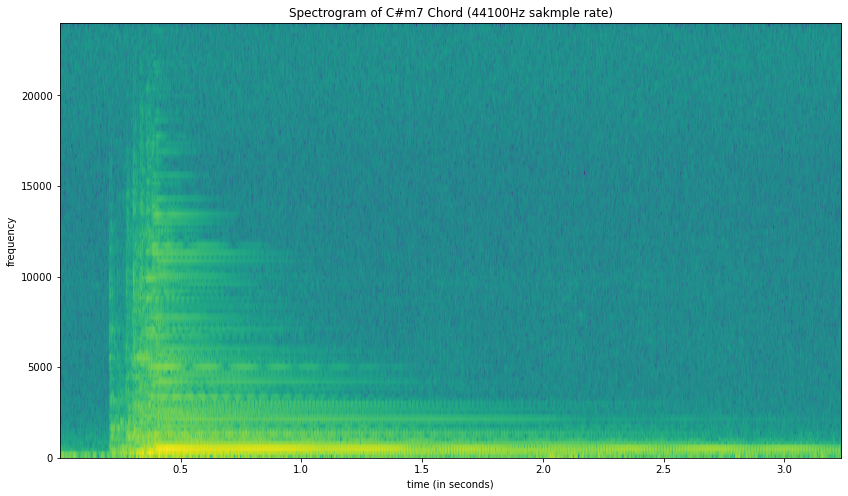

In [191]:
setup_graph(title='Spectrogram of C#m7 Chord (44100Hz sakmple rate)', x_label='time (in seconds)', y_label='frequency', fig_size=(14,8))
_ = plt.specgram(input_signal, Fs=sample_rate)

## Sinusoidal Waves of C#, E, G#, B

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 155481


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


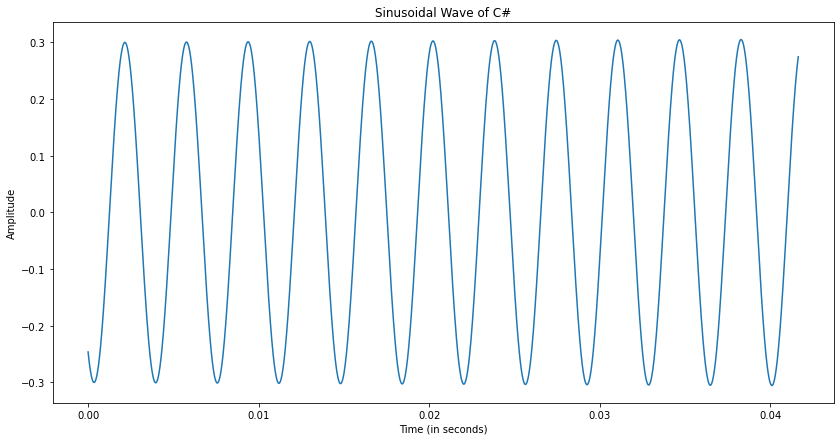

In [438]:
from IPython.display import Audio

# Set all amplitudes in the FFT except C# to zero
target_frequency = 277.183
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of C#', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

C# only has an amplitude of 0.3. It isn't really visible in our FFT.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 155481


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


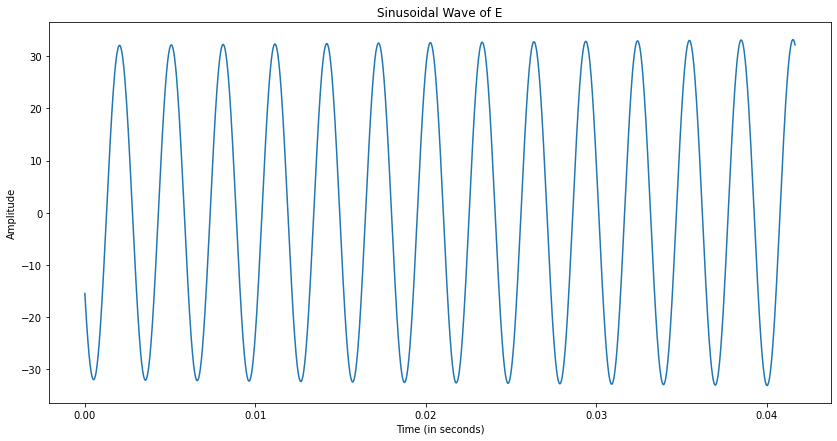

In [436]:
# Set all amplitudes in the FFT except E to zero
target_frequency = 329.628
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of E', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

E has an amplitude of 30 at its exact frequency, but we can see on the FFT graph that there is a peak almost to 100 around its frequency. E may have been a little sharp or flat when I played it.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 155481


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


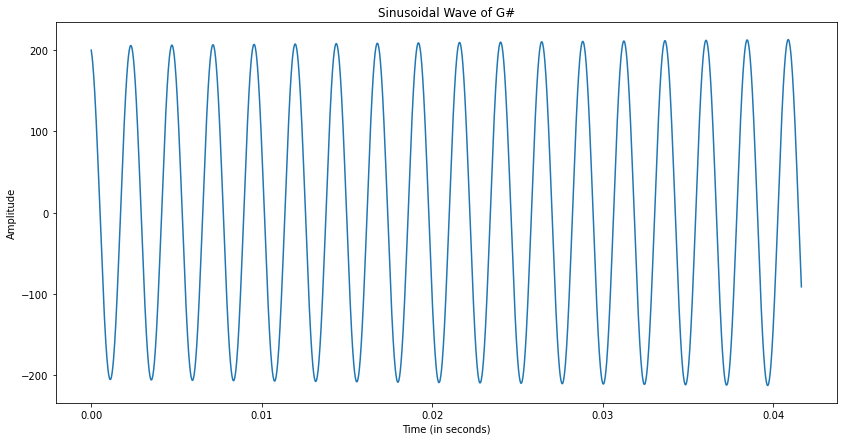

In [427]:
# Set all amplitudes in the FFT except G# to zero
target_frequency = 415.305
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of G#', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

We clearly see that the dominant peak is around 415.305 Hz, which is where G# is located. This makes sense because the chord I strummed contained 3 G# notes, and each one will have harmonic frequencies that can add up with the other G#'s fundamental frequency amplitude.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 155481


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


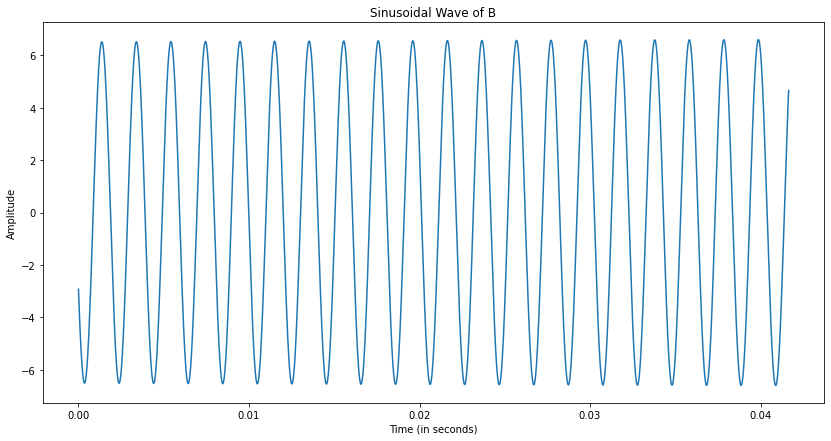

In [428]:
# Set all amplitudes in the FFT except B to zero
target_frequency = 493.883
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of B', x_label='Time (in seconds)', y_label='Amplitude', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

B has an amplitude of around 6-7. We can see from the FFT that this is approximately correct as B has a small peak.

The C#m7 chord I strummed is composed of notes G#, C#, G#, B, E, G#. The C#m7 chord consists of C#, E, G#, B. <br>
However, FFT shows peaks at frequencies for G#, B, E, G#, B, E. <br>Why is the C# not represented in the Forward FFT, but the Inverse FFT can still produce a sine wave of the C# note from the FFT? It may be due to the way I played the chord, resulting in different volume, attack, and decay.<br>I've found out that the reason why some note frequencies such as C# may not be represented is because the highest peak in the FFT signal representing G# may be overdominating the other notes as I played the chord, so there are many frequencies that may only represent the harmonic frequencies of the dominant frequency, G#, rather than the other notes I played. And as follows, possibly the lower peaks representing B and E are just harmonics of the upper peaks representing B and E.<br>Regardless, this signal is complex to analyze as it contains a lot of mixed harmonic frequencies of different notes. Following Prof. Badiey's suggestion, we should start with a simpler signal such as a synthesized sine wave or one guitar string played rather than a strum containing 6 strings played in close succession.

# Applying FFT and Inverse FFT to a synthesized sine wave sound

In [338]:
from IPython.display import Audio

sample_rate = 44100
duration = 5 
frequency = 880.0  # frequency of  A5
amplitude = 6 
# Create array of time samples at sample rate
time_samples = np.linspace(0, duration, duration * sample_rate, endpoint = False)
# Generate sine wave with time samples, frequency, amplitude
sine_wave = amplitude * np.sin(2 * np.pi * frequency * time_samples)

Audio(sine_wave, rate=sample_rate)

Sample Rate: 44100
Samples: 220500


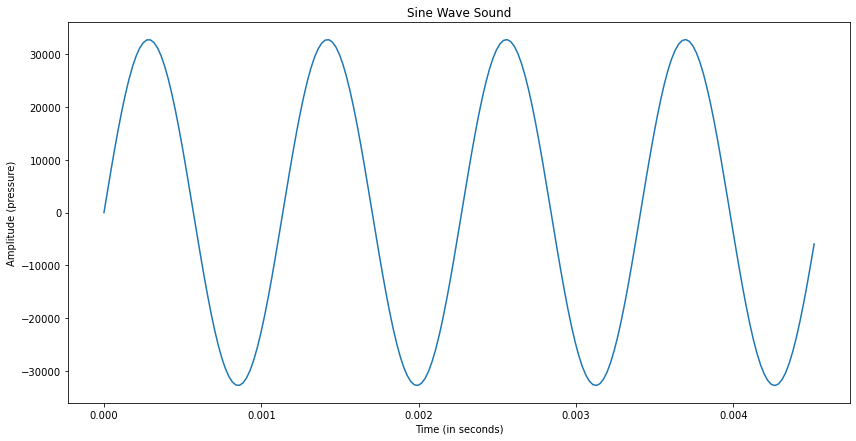

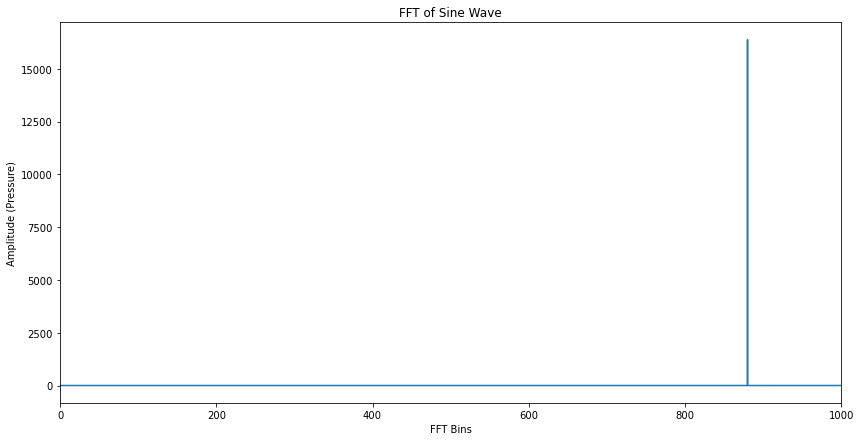

In [337]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Sine Wave - 6 Amplitude 44100 Hz.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sine Wave Sound', x_label='Time (in seconds)', y_label='Amplitude (pressure)', fig_size=(14,7))
_ = plt.plot(time_array[0:200], input_signal[0:200])

# Apply FFT to the signal
fft_out = np.fft.fft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Sine Wave', x_label='FFT Bins', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(rfreqs[0:44000], fft_mag[0:44000])
plt.xlim(0, 1000)
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)

# Play the audio signal
Audio(input_signal, rate=sample_rate)

This is interesting. I specified an original amplitude of 6 for the sine wave, however I made it play for 5 seconds at a sampling rate of 44,100 (per second). This means that the total samples is 44,100 * 5 = 220,500 samples. A period in the graph as shown is around 0.0015 seconds. At our sample rate, this is equal to around 66.15 samples in one period.<br>My signal's length is much longer than 66.15 samples, so the FFT coefficients will be much higher resulting in amplitudes of over 30,000 rather than 6.<br>We can see that the FFT correctly calculates a frequency at 880.0 Hz

Duration: 5.0 seconds
Sampling Rate: 44100 Hz
Samples: 220500


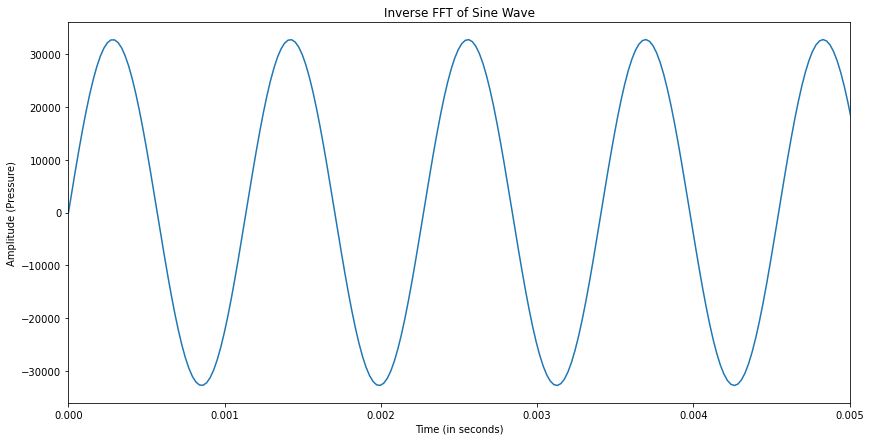

In [334]:
ifft_out = np.fft.ifft(fft_out)
ifft_real = np.real(ifft_out)
# Duration of audio signal (seconds)
signal_duration = len(ifft_out) / sample_rate
# Create an array of time values, with one value for each sample in the signal
wave_time = np.arange(0, signal_duration, 1/sample_rate)
print("Duration:", signal_duration, "seconds")
print("Sampling Rate:", sample_rate, "Hz")
print("Samples:", len(ifft_out))

# Graph our Inverse FFT
setup_graph(title='Inverse FFT of Sine Wave', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(wave_time[0:1100], ifft_real[0:1100])
plt.xlim(0.0, 0.005)

Audio(ifft_real, rate=sample_rate)

The Inverse FFT looks almost identical to our original signal! And we have reproduced the original sine wave sound by computing the FFT of the original signal and then the Inverse FFT of that FFT.

# Applying FFT and Inverse FFT to a Synthesized Saw

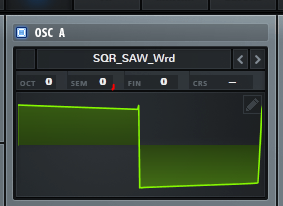

Here I have a saw wave from the audio plugin "Serum" and what it should look close to graphically. We're going to record it at G#5, import this signal, and apply FFT and inverse FFT the same way as with the sine wave to reproduce the original signal.

C:\Users\andre.ANDREWGAMING\AppData\Local\Temp\ipykernel_11440\3057310521.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  (sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Saw.wav")


Sample Rate: 44100
Samples: 75994


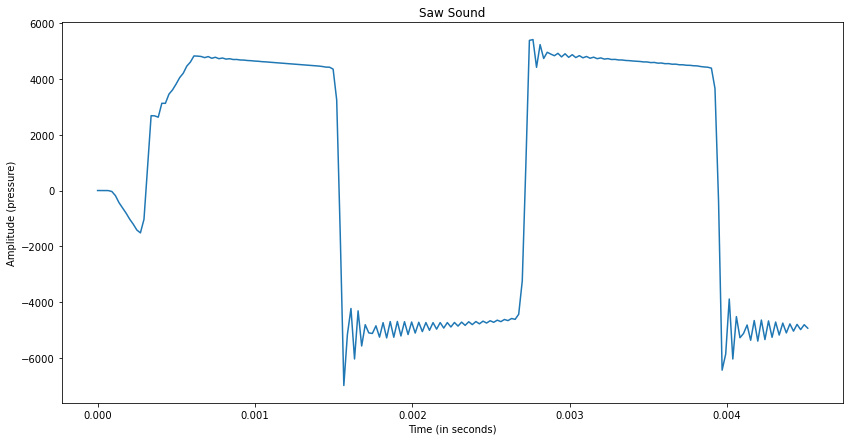

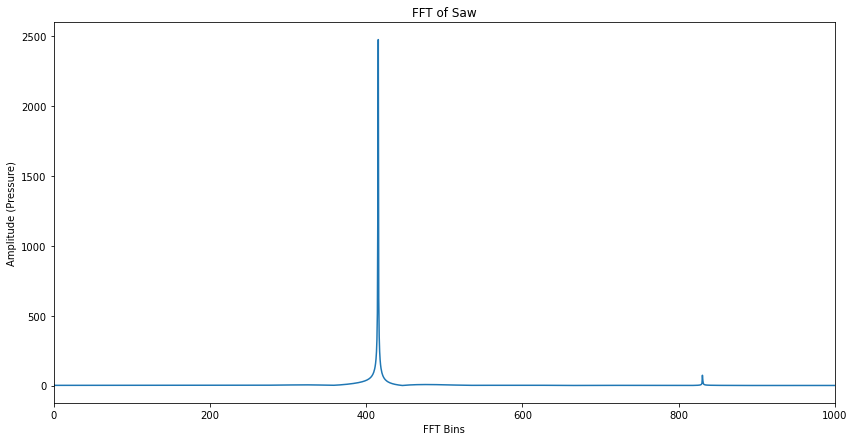

In [481]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Saw.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Saw Sound', x_label='Time (in seconds)', y_label='Amplitude (pressure)', fig_size=(14,7))
_ = plt.plot(time_array[0:200], input_signal[0:200])

# Apply FFT to the signal
fft_out = np.fft.fft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Saw', x_label='FFT Bins', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(rfreqs[0:10000], fft_mag[0:10000])
plt.xlim(0, 1000)
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)

# Play the audio signal
Audio(input_signal, rate=sample_rate)

Duration: 1.723219954648526 seconds
Sampling Rate: 44100 Hz
Samples: 75994


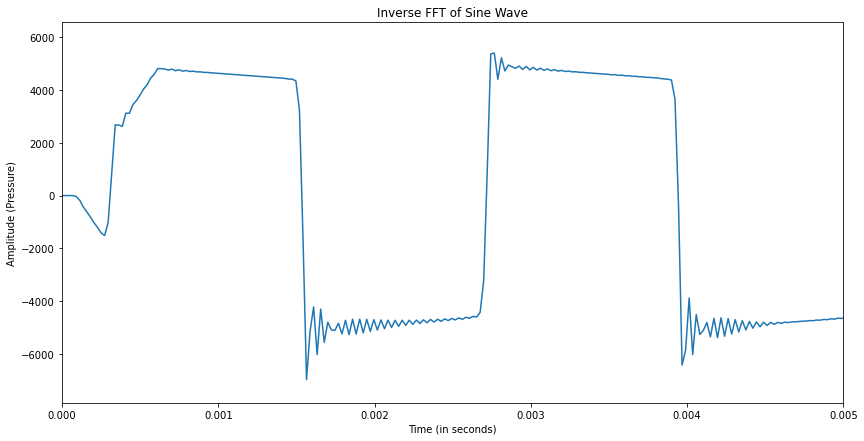

In [482]:
ifft_out = np.fft.ifft(fft_out)
ifft_real = np.real(ifft_out)
# Duration of audio signal (seconds)
signal_duration = len(ifft_out) / sample_rate
# Create an array of time values, with one value for each sample in the signal
wave_time = np.arange(0, signal_duration, 1/sample_rate)
print("Duration:", signal_duration, "seconds")
print("Sampling Rate:", sample_rate, "Hz")
print("Samples:", len(ifft_out))

# Graph our Inverse FFT
setup_graph(title='Inverse FFT of Sine Wave', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(wave_time[0:1100], ifft_real[0:1100])
plt.xlim(0.0, 0.005)

Audio(ifft_real, rate=sample_rate)

We successfully reproduced the original saw signal using FFT and Inverse FFT!

### What if I played the sine and saw waves together and applied FFT? Let's see if we get their two frequencies. Then, we can isolate the frequencies, apply inverse FFT, and we should get these same sinusoidal waveforms.

C:\Users\andre.ANDREWGAMING\AppData\Local\Temp\ipykernel_11440\231672953.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  (sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Sine and Saw Wave.wav")


Sample Rate: 44100
Samples: 76388


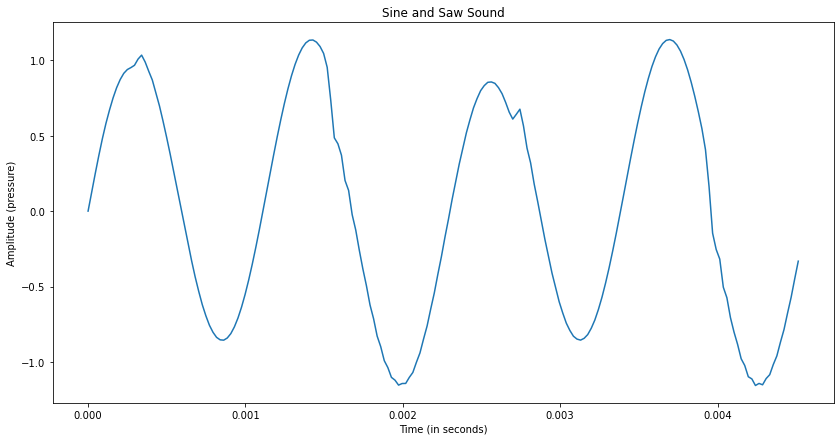

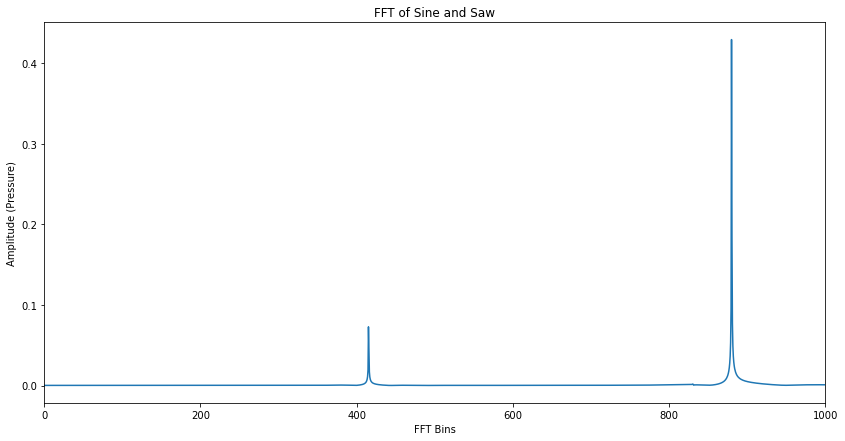

In [483]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Sine and Saw Wave.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sine and Saw Sound', x_label='Time (in seconds)', y_label='Amplitude (pressure)', fig_size=(14,7))
_ = plt.plot(time_array[0:200], input_signal[0:200])

# Play the audio signal
Audio(input_signal, rate=sample_rate)

# Apply FFT to the signal
fft_out = np.fft.fft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Sine and Saw', x_label='FFT Bins', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(rfreqs[0:10000], fft_mag[0:10000])
plt.xlim(0, 1000)
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)

Duration: 1.723219954648526 seconds
Sample Rate: 44100
Samples: 76388


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


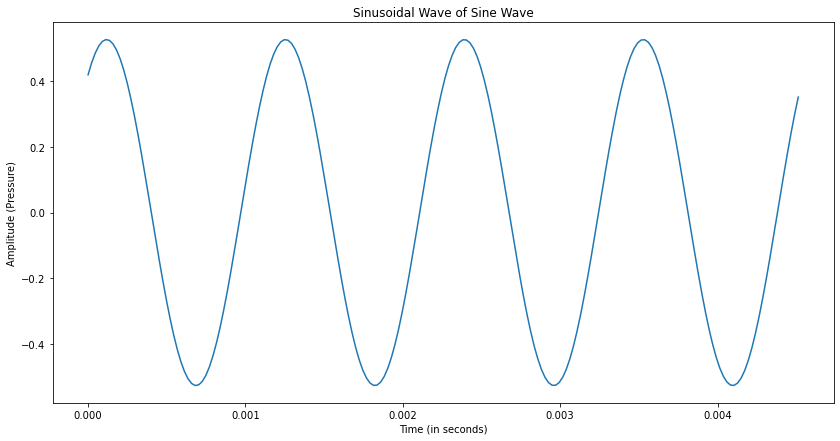

In [484]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 880.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Sine Wave', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:200], harmonic_signal_real[0:200])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

Duration: 1.723219954648526 seconds
Sample Rate: 44100
Samples: 76388


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


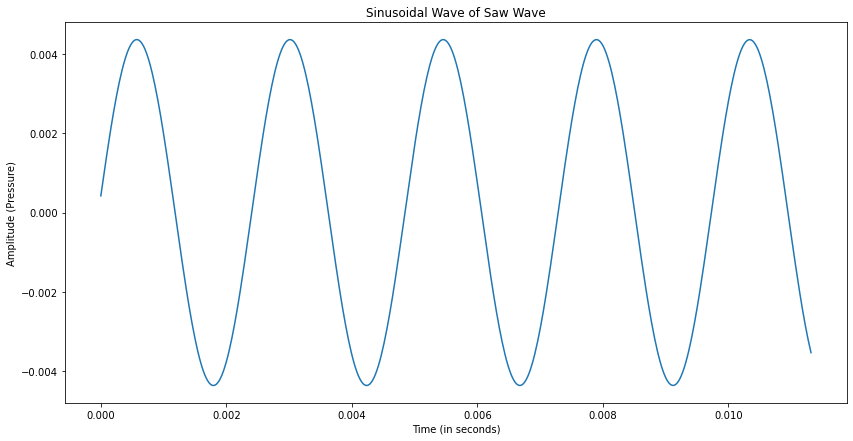

In [489]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 410.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Saw Wave', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:500], harmonic_signal_real[0:500])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

# Exploring Fretting Strength on Acoustic Guitar

Prof. Badiey explained to me that a building is like a stick--both systems are fixed on one end and freely moves on the other. This results in a vibration when there is some force acts on it, such as the skyscraper wobbling a bit due to harsh winds.<br>These systems have many different modes than can be portrayed graphically. Mode 1 is the dominant node, and we may be able to see Mode 2 where it vibrates a little bit, but we may not see Mode 3 and so on due to human limitation.<br><br>
The guitar string, on the other hand, is a system that can be fixed on two ends when you're playing: the bridge and the finger.<br>It is clear to see that a guitar string vibrates when you pick on it, so it ends up creating signals with many different modes, and thus various harmonic frequencies with some of which humans may not be able to hear. Of course, the dominant mode we hear is the one with the note, which has the dominant frequency if we were to look at it in the frequency domain compared to other modes. This dominant frequency is what we call the fundamental frequency. Harmonic frequencies will be integer multiples of this fundamental; they have almost the same sinusoidal waveform but may have different frequencies and amplitudes.<br><br>Let's test this out with various fretting strengths on the fifth fret of Low E string (A3 ~220 Hz)!

### Strong Fretting

Sample Rate: 48000
Samples: 180704


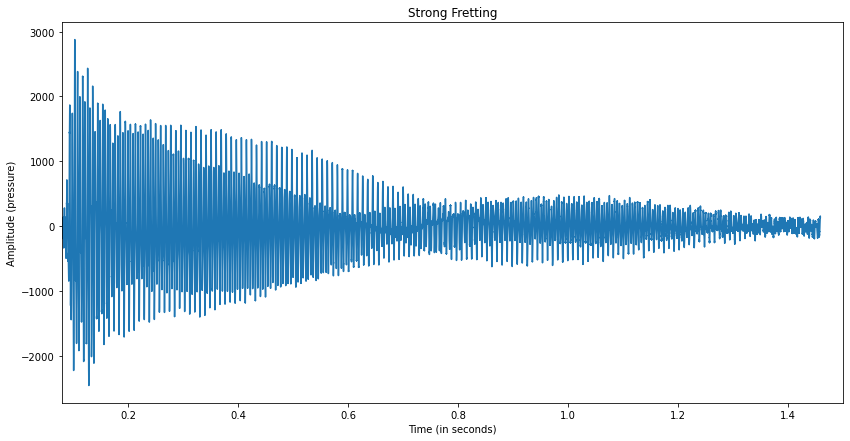

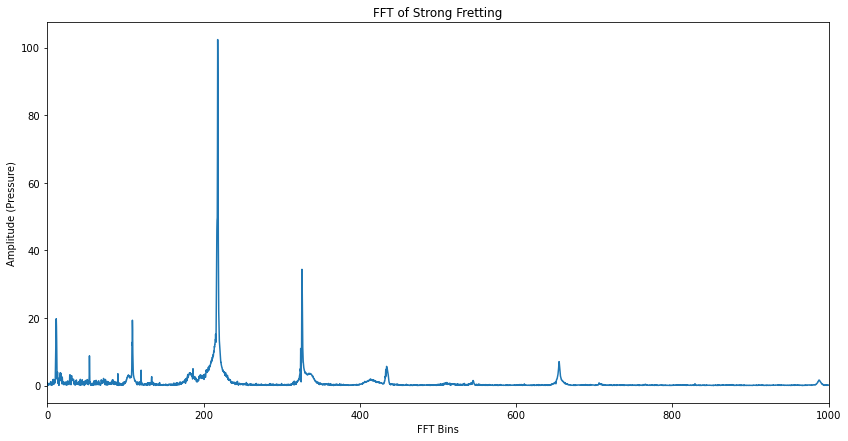

In [456]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Strong Fretting.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Strong Fretting', x_label='Time (in seconds)', y_label='Amplitude (pressure)', fig_size=(14,7))
_ = plt.plot(time_array[0:70000], input_signal[0:70000])
plt.xlim(0.08, 1.5)

# Apply FFT to the signal
fft_out = np.fft.fft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Strong Fretting', x_label='FFT Bins', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(rfreqs[0:10000], fft_mag[0:10000])
plt.xlim(0, 1000)
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)

# Play the audio signal
Audio(input_signal, rate=sample_rate)

We find that although we played one note, A3, there are many different frequency peaks showing up, which are the harmonics of A3 as discussed earlier. Let's isolate them and see how their sinusoidal waves look like and sound.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 180704


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


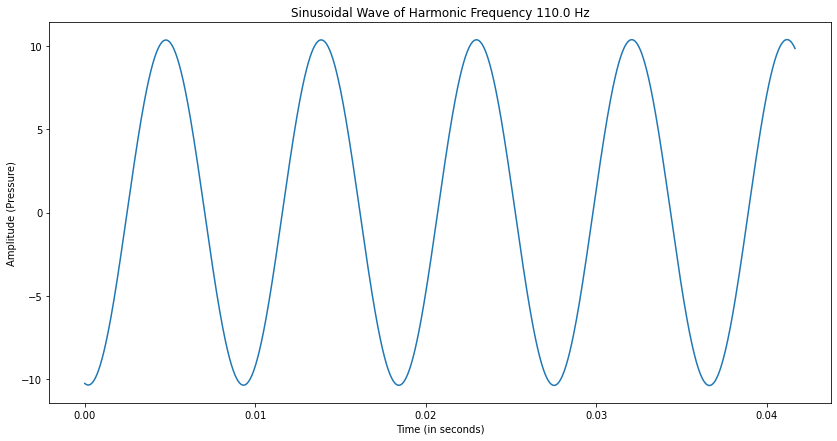

In [458]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 110.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Harmonic Frequency 110.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 180704


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


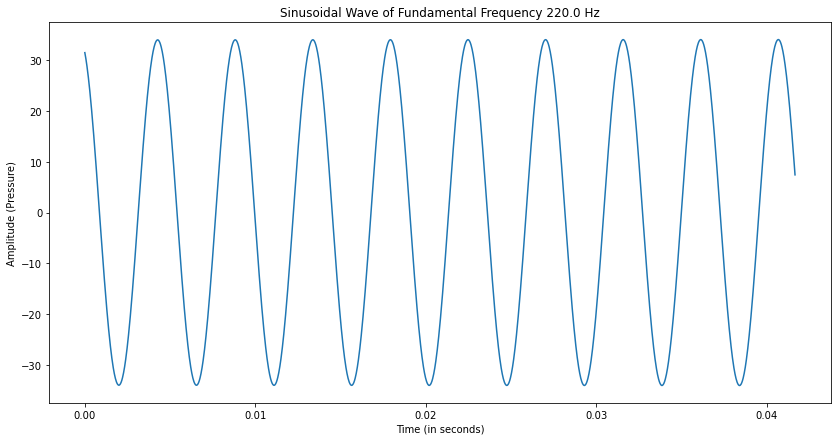

In [459]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 220.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Fundamental Frequency 220.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 180704


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


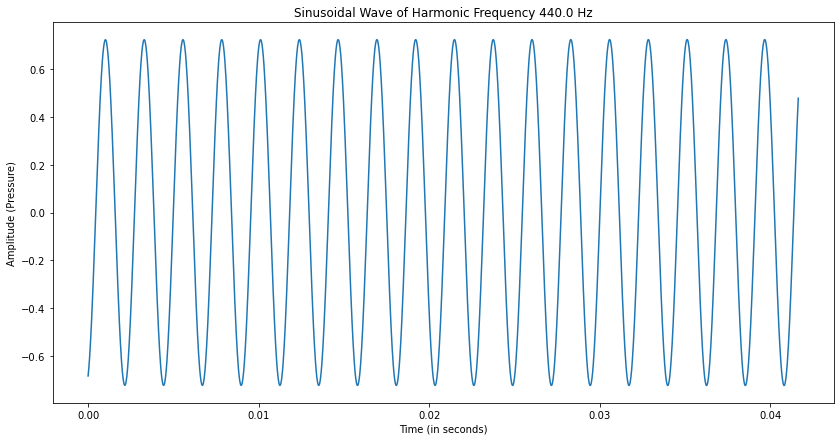

In [461]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 440.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Harmonic Frequency 440.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

Strangely enough, we found a second highest peak that was not an integer multiple of A3, but it does not necessarily have to be an integer multiple to be considered a harmonic frequency.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 180704


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


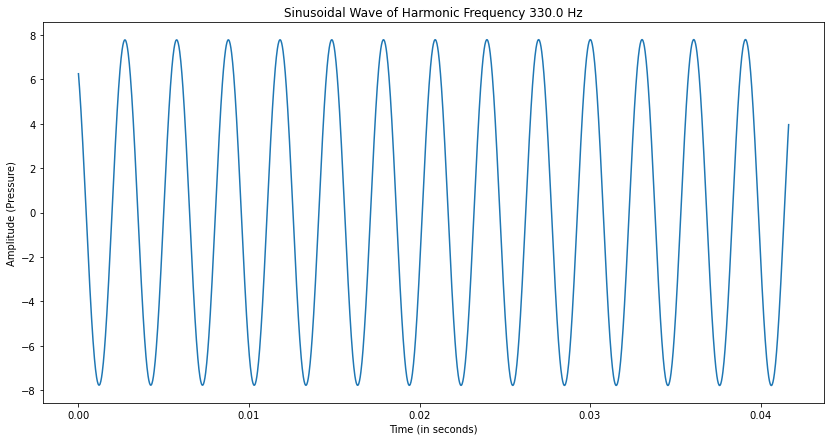

In [462]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 330.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Harmonic Frequency 330.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

### Medium Fretting

Sample Rate: 48000
Samples: 149908


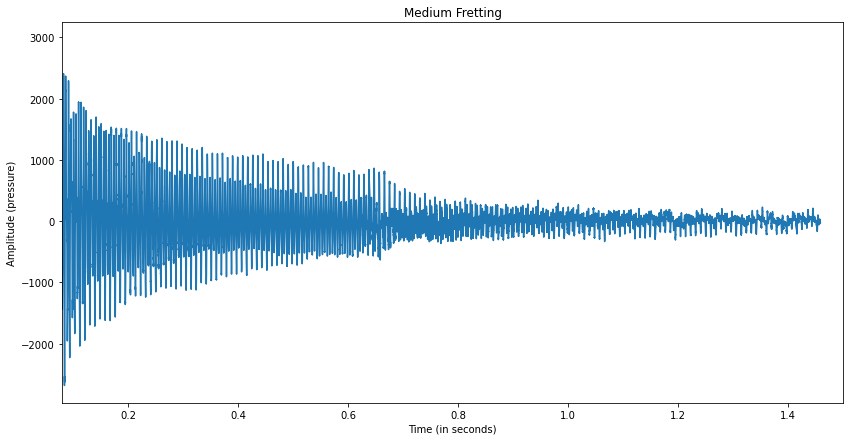

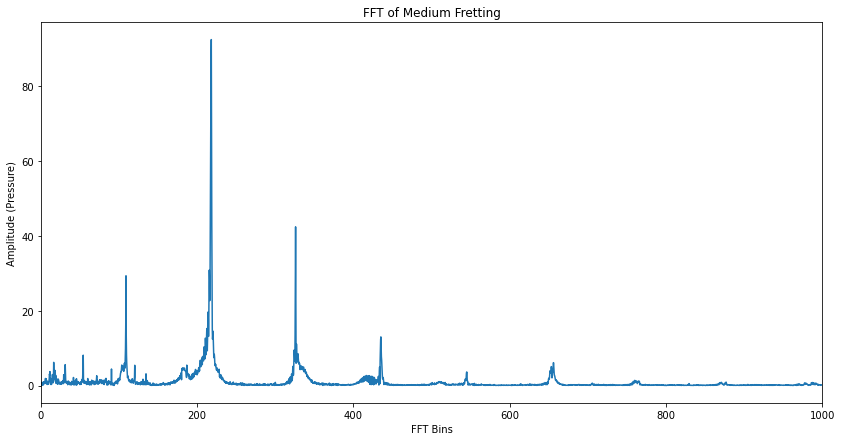

In [463]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Medium Fretting.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Medium Fretting', x_label='Time (in seconds)', y_label='Amplitude (pressure)', fig_size=(14,7))
_ = plt.plot(time_array[0:70000], input_signal[0:70000])
plt.xlim(0.08, 1.5)

# Apply FFT to the signal
fft_out = np.fft.fft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Medium Fretting', x_label='FFT Bins', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(rfreqs[0:10000], fft_mag[0:10000])
plt.xlim(0, 1000)
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)

# Play the audio signal
Audio(input_signal, rate=sample_rate)

We can hear that there's a slight buzz in the sound and the amplitude of the highest peak is lower, but the second highest peak is higher. There are also many other harmonic frequencies that have increased in amplitude around these two peaks. Could this be related to the buzz which may have been caused by the string hitting the fretboard more aggressively? Well, it certainly sounds more aggressive than a clean, strong fretting.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 149908


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


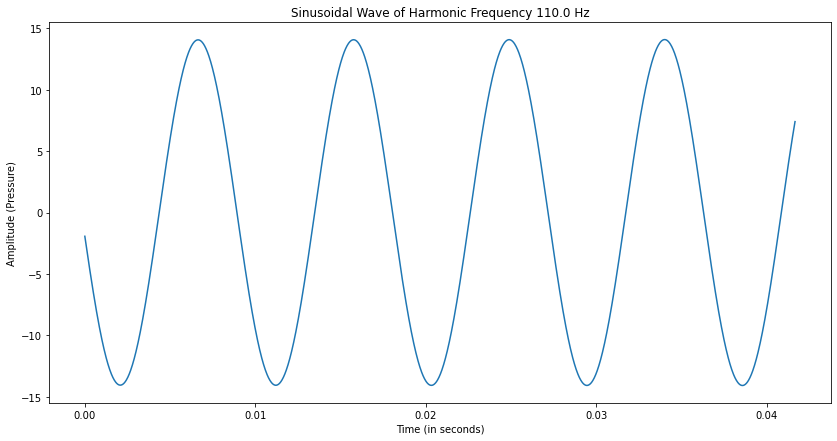

In [464]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 110.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Harmonic Frequency 110.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

Around an increase in 4 amplitude.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 149908


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


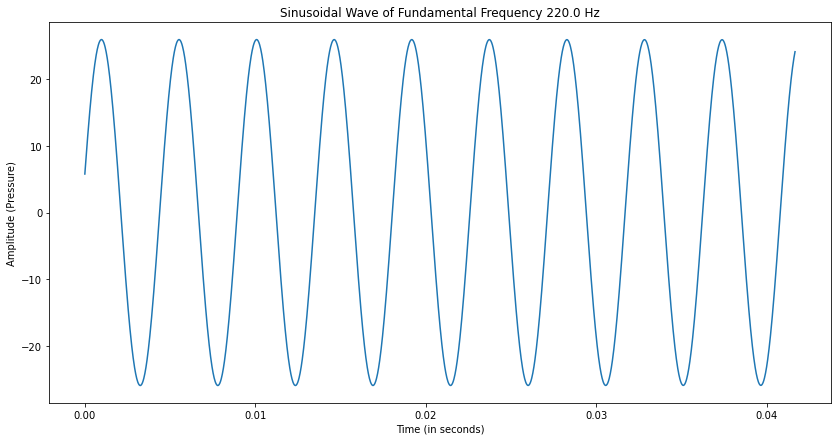

In [465]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 220.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Fundamental Frequency 220.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

This is the fundamental frequency. Around a decrease in 10 amplitude from strong fretting.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 149908


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


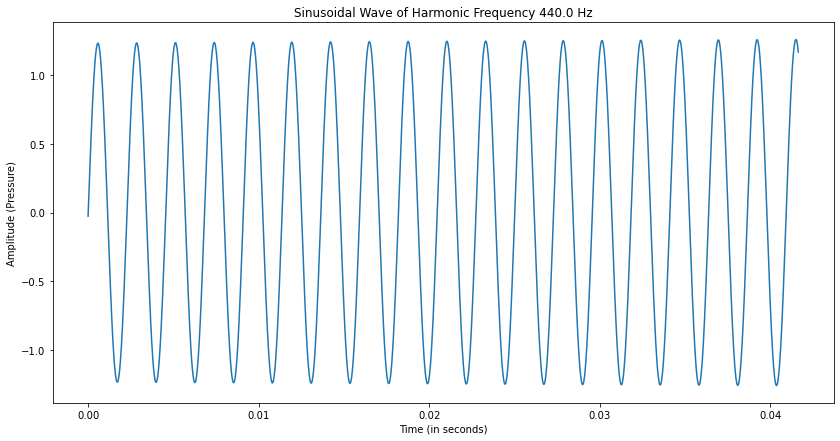

In [466]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 440.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Harmonic Frequency 440.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

Around a 0.5 increase in amplitude.

Duration: 3.2391875 seconds
Sample Rate: 48000
Samples: 149908


C:\Users\andre.ANDREWGAMING\anaconda3\lib\site-packages\IPython\lib\display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


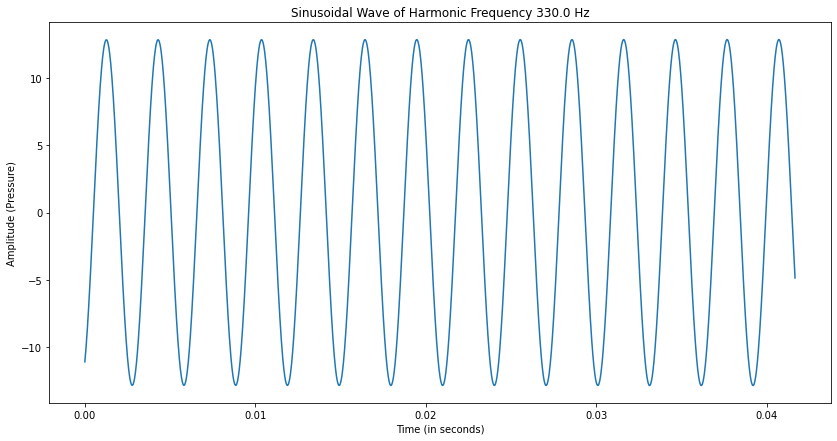

In [468]:
# Set all amplitudes in the FFT except the target frequency to zero
target_frequency = 330.0
# Index of target frequency
fft_out = np.fft.fft(input_signal)
bin_index = int(target_frequency * len(fft_out) / sample_rate)
fft_out[:bin_index-1] = 0
fft_out[bin_index+1:] = 0

# Apply Inverse FFT and extract real part
harmonic_signal = np.fft.ifft(fft_out)
harmonic_signal_real = np.real(harmonic_signal)

# Graph our Inverse FFT
time_samples = np.arange(0, len(harmonic_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Sinusoidal Wave of Harmonic Frequency 330.0 Hz', x_label='Time (in seconds)', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(time_samples[0:2000], harmonic_signal_real[0:2000])


print("Duration:", signal_duration, "seconds")
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)
Audio(harmonic_signal, rate=sample_rate)

Around a 4 increase in amplitude.

### Weak Fretting

Sample Rate: 48000
Samples: 129846


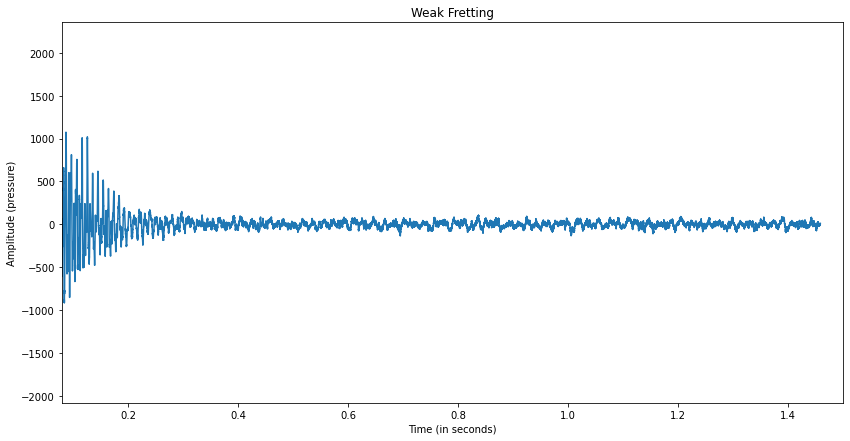

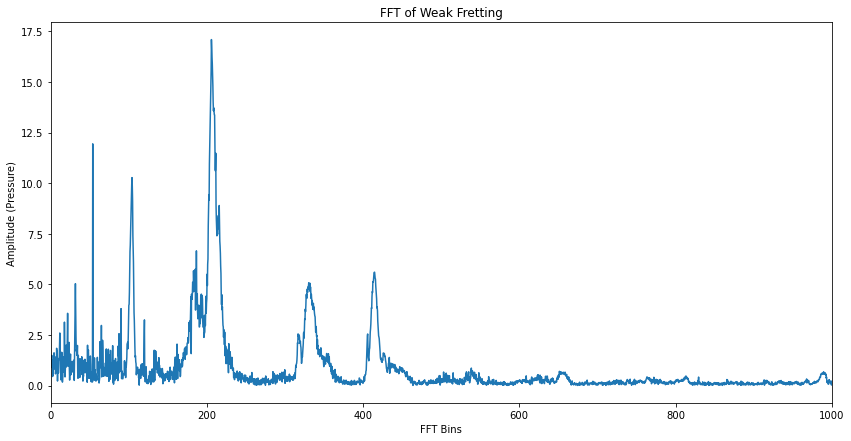

In [469]:
(sample_rate, input_signal) = scipy.io.wavfile.read("audio_files/Weak Fretting.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
setup_graph(title='Weak Fretting', x_label='Time (in seconds)', y_label='Amplitude (pressure)', fig_size=(14,7))
_ = plt.plot(time_array[0:70000], input_signal[0:70000])
plt.xlim(0.08, 1.5)

# Apply FFT to the signal
fft_out = np.fft.fft(input_signal)
fft_mag = [np.sqrt(i.real**2 + i.imag**2)/len(fft_out) for i in fft_out]
num_samples = len(input_signal)
rfreqs = [(i*1.0/num_samples)*sample_rate for i in range(num_samples//2+1)]

setup_graph(title='FFT of Weak Fretting', x_label='FFT Bins', y_label='Amplitude (Pressure)', fig_size=(14,7))
_ = plt.plot(rfreqs[0:10000], fft_mag[0:10000])
plt.xlim(0, 1000)
print("Sample Rate:", sample_rate)
print("Samples:", num_samples)

# Play the audio signal
Audio(input_signal, rate=sample_rate)

The fundamental and harmonic frequencies have dropped a significant amount compared to strong and medium fretting. This makes sense because weak fretting results in an almost muted sound, so I expected the amplitudes to decrease.<br>If we graph the sinusoidal waveforms of the harmonic frequencies, we'll just find that they have all decreased.